# Spectral optimization through BO with adaptive target setting

This is modified BO recommder system framework for connect with microscope

## *   Rama Vasudevan proposed the idea
## *   Arpan Biswas developed BO recommender system framework
## *   Yongtao Liu adapted to make it compatible with microscopy measurement

# Problem Description

Build a BO framework-

- Here we have a image data, where X is the input location of the image

- Each location in the image, we have a spectral data, from where user select if the data is good/bad (discrete choice). We take the means of all good spectral only to generate the target spectral.

- At the mid of execution, the user also have option to either eliminate (or update the preferance) all the previously stored (if user suddenly find a desired spectral) spectral, and put more weights on new found spectral.

- The goal is to build a optimization (BO) model where we adaptively sample towards region (in image) of good spectral, and find optimal location point closest to the current chosen target spectral (as per user voting).

# Workflow: Run BO to find the optimal location for user-desired spectral as per voting

- Here we vote the quality of spectral, for example: trying to get a greater loop area, with minimal noise and be as much towards theoritical hysteresis loop.

- User interaction part:
    1. Load Data. Currently, we have two dataset to choose: BEPFM and IV.
    2. Initialize parameters. Select # of randomly selected starting samples (pre BO) and # of total BO iterations.
    3. During the play (for each function evaluation)-

        1. View spectral image. User have three rating options as 0, 1, 2: 0-Bad, 1-Good, 2-Very good.
              1. If user rated as Good or Very Good, and user already have a current target spectral (user already selected at least one good/very good spectral in earlier iterations), another message pops up if the user want to update preference of new spectral Vs the current target spectral(Y or N).
                1. If user choose "Y", user have option (any number between 0-1) to provide weights of new spectral. For example: If user provide 1 as input, the updated target spectral will be only the new chosen spectral and all the other earlier selected good spectral will be eliminated from target.
                2. If user choose "N", as default the updated target spectral is the mean of all the earlier selected spectral and the new spectral.


- After END OF PLAY, the code automatically save below data (serially) in optim.results.npy

  1. Best locations, from evaluated samples and GP estimated

  2. User rating of spectral at each evaluated locations in image

  3. the matrices of evaluated location and the respective obj values


In [2]:
import sys
import torch
from torchvision import datasets, transforms
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import random

from PIL import Image
from typing import Tuple
import ipywidgets as widgets

from IPython.display import display
import pylab as pl
from IPython.display import clear_output
import pdb
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable
#import gpim
import matplotlib.gridspec as gridspec
from copy import deepcopy

from typing import Union

# Import GP and BoTorch functions
import gpytorch as gpt
#from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan

from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions

from gpytorch.models import ExactGP
from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
from scipy.interpolate import interp1d
from atomai import utils

import time


class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=2.5, ard_num_dims=train_X.shape[-1]),
            base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


class play_varTBO():

    def __init__(self):
      pass

    @classmethod
    def func_obj(self, X, new_spec_x, new_spec_y, wcount_good, target_func, vote):
        idx1 = int(X[0, 0])
        idx2 = int(X[0, 1])
        rf = 1
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            mse_spectral = torch.rand(1)*(1)+1 # Unif[1, 2] A sufficiently large value as we want to avoid selecting bad loops,
            # When we have a target, we will recalculate again to get more accuract estimate
            R = vote*rf

        else:
            #Calculate dissimilarity (mse) between target and ith loop shape
            dev2_spectral = (target_func-new_spec_y)**2
            mse_spectral = torch.mean(dev2_spectral)
            #Calculate reward as per voting, this will minimize the risk of similar function values of good and bad loop shape with similar mse
            R = vote*rf

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = R - mse_spectral #Maximize reward and negative mse

        return obj

    @classmethod
    def optimize_hyperparam_trainGP(self, train_X, train_Y):
        # Gp model fit

        gp_surro = SimpleCustomGP(train_X, train_Y)
        gp_surro = gp_surro.double()
        gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
        mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)
        # fit_gpytorch_model(mll)
        mll1 = mll1.to(train_X)
        gp_surro.train()
        gp_surro.likelihood.train()
        ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
        optimizer1 = Adam([{'params': gp_surro.parameters()}], lr=0.1) #0.01 set for BEPFM data, recommended to check the lr for any new data
        #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

        NUM_EPOCHS = 150

        for epoch in range(NUM_EPOCHS):
            # clear gradients
            optimizer1.zero_grad()
            # forward pass through the model to obtain the output MultivariateNormal
            output1 = gp_surro(train_X)
            # Compute negative marginal log likelihood
            loss1 = - mll1(output1, gp_surro.train_targets)
            # back prop gradients
            loss1.backward(retain_graph=True)
            # print last iterations
            if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
                print("GP Model trained:")
                print("Iteration:" + str(epoch + 1))
                print("Loss:" + str(loss1.item()))
                # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
                print("noise:" + str(gp_surro.likelihood.noise.item()))

            optimizer1.step()

        gp_surro.eval()
        gp_surro.likelihood.eval()
        return gp_surro

    @classmethod
    def cal_posterior(self, gp_surro, test_X):
        y_pred_means = torch.empty(len(test_X), 1)
        y_pred_vars = torch.empty(len(test_X), 1)
        t_X = torch.empty(1, test_X.shape[1])
        for t in range(0, len(test_X)):
            with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
                gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                          solves=True), \
                gpt.settings.max_cg_iterations(100), \
                gpt.settings.max_preconditioner_size(80), \
                gpt.settings.num_trace_samples(128):

                    t_X[:, 0] = test_X[t, 0]
                    t_X[:, 1] = test_X[t, 1]
                    #t_X = test_X.double()
                    y_pred_surro = gp_surro.posterior(t_X)
                    y_pred_means[t, 0] = y_pred_surro.mean
                    y_pred_vars[t, 0] = y_pred_surro.variance

        return y_pred_means, y_pred_vars

    @classmethod
    def acqmanEI(self, y_means, y_vars, train_Y, ieval):
        y_means = y_means.detach().numpy()
        y_vars = y_vars.detach().numpy()
        y_std = np.sqrt(y_vars)
        fmax = train_Y.max()
        fmax = fmax.detach().numpy()
        best_value = fmax
        EI_val = np.zeros(len(y_vars))
        Z = np.zeros(len(y_vars))
        eta = 0.01

        for i in range(0, len(y_std)):
            if (y_std[i] <=0):
                EI_val[i] = 0
            else:
                Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
                EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

        # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
        EI_val[ieval] = -1
        acq_val = np.max(EI_val)
        acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
        #print(acq_val)
        return acq_cand, acq_val, EI_val

    @classmethod
    def augment_newdata_KL(self, acq_X, acq_X_norm, train_X, train_X_norm, train_Y,
                           new_spec_x, new_spec_y, img_space, var_params, m):
        wcount_good, pref, target_func = var_params[0], var_params[1], var_params[2]

        nextX = acq_X
        nextX_norm = acq_X_norm
        train_X_norm = torch.vstack((train_X_norm, nextX_norm))
        train_X = torch.vstack((train_X, nextX))

        p = torch.empty(1, 1)
        x = torch.empty((1,2))
        x[0, 0] = train_X[-1, 0]
        x[0, 1] = train_X[-1, 1]

        print("\n\nSample #" + str(m + 1))
        #Vote for new spectral sample and update(or not) target spectral function
        p[0, 0], wcount_good, target_func = self.generate_targetobj(x[0, 0], x[0, 1], new_spec_x, new_spec_y, img_space, wcount_good, target_func)
        pref = torch.vstack((pref, p)) #Augment pref matrix

        if (p[0, 0] == 0):
          # If target loop is not updated, we eval for the new samples only as the
          # func value for others remain the same

            next_feval = torch.empty(1, 1)
            next_feval[0, 0] = self.func_obj(x, new_spec_x, new_spec_y, wcount_good, target_func, pref[-1, 0])
            train_Y = torch.vstack((train_Y, next_feval))
        else:
            # If target loop is updated, we reevaluate the obj of old spectral samples and
            # eval for the new samples
            train_Y = torch.empty((train_X.shape[0], 1))
            for i in range(0, train_X.shape[0]):
                x[0, 0] = train_X[i, 0]
                x[0, 1] = train_X[i, 1]
                train_Y[i, 0] = self.func_obj(x, new_spec_x, new_spec_y, wcount_good, target_func, pref[i, 0])

        var_params = [wcount_good, pref, target_func]
        m = m + 1
        return train_X, train_X_norm, train_Y, var_params, m

    @classmethod
    def generate_targetobj(self, idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func):
      #count_good= 0
      idx1 = int(idx_x)
      idx2 = int(idx_y)
      if (wcount_good == 0):
        # Figure for user choice
        fig,ax=plt.subplots(ncols=2,figsize=(12,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx1) +"," + str(idx2), fontsize = 20)
        plt.show()

      else:
        # Figure for user choice
        fig,ax=plt.subplots(ncols=3,figsize=(18,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx1) +"," + str(idx2), fontsize = 20)
        ax[2].plot(new_spec_x,target_func)
        ax[2].set_title('Current target function', fontsize = 20)
        plt.show()

      print("Rating: 0-Bad, 1-Good, 2-Very good")
      time.sleep(0.5)
      vote = float(input("enter rating: "))
      if(vote>0):
        newspec_wt = 1
        if ((wcount_good) > 0): #Only if we already have selected good spectral in early iterations
          newspec_pref = str(input("Do you want to update preference to new spectral over prioir mean target \n(Y/N): "))
          if (newspec_pref == 'Y' or newspec_pref == 'y'):
            print("Provide weights between 0 and 10: \n10 being all the weights to new spectral as new target, ")
            newspec_wt = float(input("enter weightage: "))/10
            print(newspec_wt)
          else:
            newspec_wt = 0.5
        wcount_good =wcount_good + vote
        target_func = (((1-newspec_wt)*target_func*(wcount_good-vote))+(newspec_wt*vote*new_spec_y))/(((
            wcount_good-vote)*(1-newspec_wt)) + (vote*newspec_wt))
      return vote, wcount_good, target_func

    @classmethod
    def estimate (self, train_X, train_Y, test_X, y_pred_means):
        #Best solution among the evaluated data
        loss = torch.max(train_Y)
        ind = torch.argmax(train_Y)
        X_opt = torch.empty((1,2))
        X_opt[0, 0] = train_X[ind, 0]
        X_opt[0, 1] = train_X[ind, 1]

        # Best estimated solution from GP model considering the non-evaluated solution
        loss = torch.max(y_pred_means)
        ind = torch.argmax(y_pred_means)
        X_opt_GP = torch.empty((1,2))
        X_opt_GP[0, 0] = test_X[ind, 0]
        X_opt_GP[0, 1] = test_X[ind, 1]

        return X_opt, X_opt_GP

#Help function
def plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_opt, X_opt_GP, img_space, i):
  pen = 10**0
  #Objective map
  fig,ax=plt.subplots(ncols=3,figsize=(18,5))
  a= ax[0].imshow(img_space, origin="lower")
  ax[0].scatter(train_X[:,1], train_X[:,0], marker='o', c='g')
  ax[0].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[0].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(test_X[:,1], test_X[:,0], c=y_pred_means/pen, cmap='viridis', linewidth=0.2)
  ax[1].scatter(train_X[:,1], train_X[:,0], marker='o', c='g')
  ax[1].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[1].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  divider = make_axes_locatable(ax[1])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(a, cax=cax, orientation='vertical')
  ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)
  #ax[1].colorbar(a)

  b = ax[2].scatter(test_X[:,1], test_X[:,0], c=y_pred_vars/(pen**2), cmap='viridis', linewidth=0.2)
  divider = make_axes_locatable(ax[2])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(b, cax=cax, orientation='vertical')
  ax[2].set_title('Objective (GP var) map', fontsize=10)
  ax[2].axes.xaxis.set_visible(False)
  ax[2].axes.yaxis.set_visible(False)
  #ax[2].colorbar(b)
  plt.show()



# Simulator - Simulate experimental results

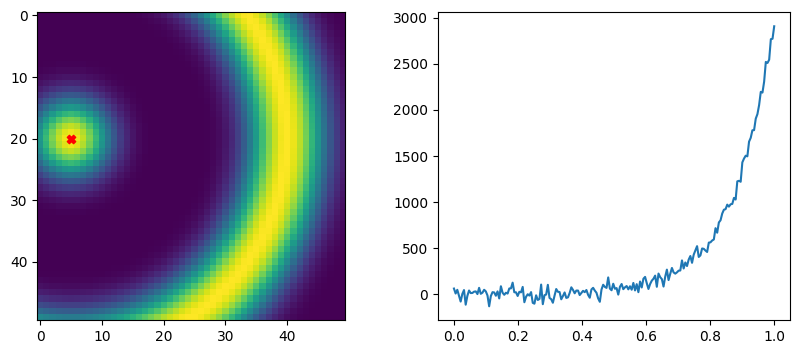

In [9]:
def img_simulator(img_size):
  im_x, im_y = np.ogrid[:img_size, :img_size]
  # Creating a rotation-invariant image with different spatial frequencies.
  image_rot = (np.exp(0.9j * np.hypot(im_x-20, im_y-5) / 5 ).real + 1)
  img = image_rot**3
  return img

def spec_simulator(img, spec_size, idxx, idxy):
  x = np.linspace(0., 1, spec_size)
  xx = x + 1j * x[:, np.newaxis]
  out = np.exp(xx)

  k = img[idxx, idxy]
  y = np.exp(k * x)
  y = y + np.random.normal(scale=np.sqrt(np.max(y)), size=len(x))  # Add noise
  return torch.from_numpy(x), torch.from_numpy(y)

#simulate an image
img_size_ = 50
img = img_simulator(img_size_)

#simulate a spectral at [idxx, idxy]
idxx = 20; idxy = 5
spec_x, spec_y = spec_simulator(img, 64*3, idxx, idxy)

_, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))
ax1.imshow(img)
ax1.scatter(idxy, idxx, marker = "X", color = "r")
ax2.plot(spec_x, spec_y)

# Initial evaluation



Sample #1


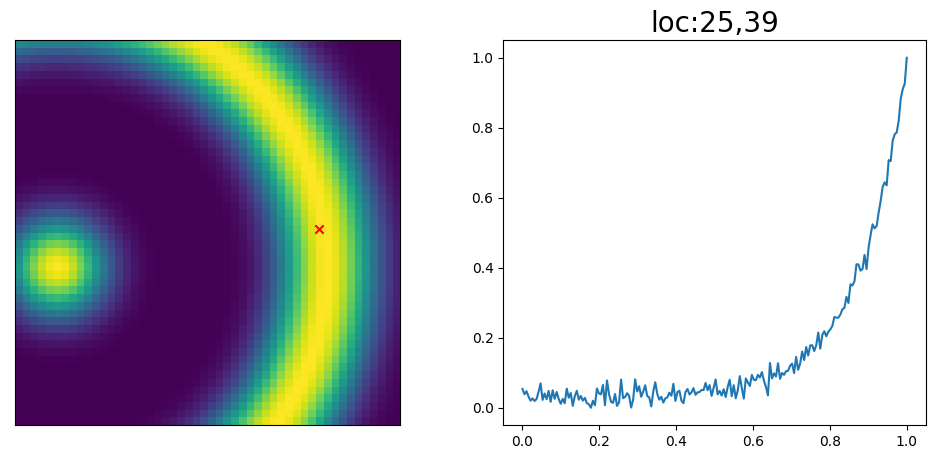

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2


Sample #2


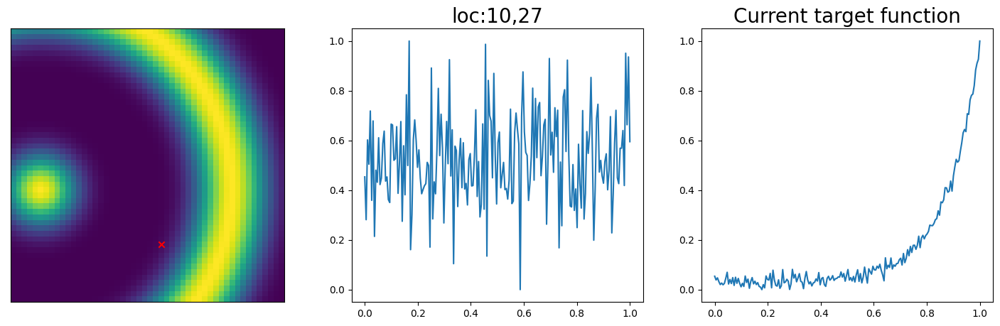

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #3


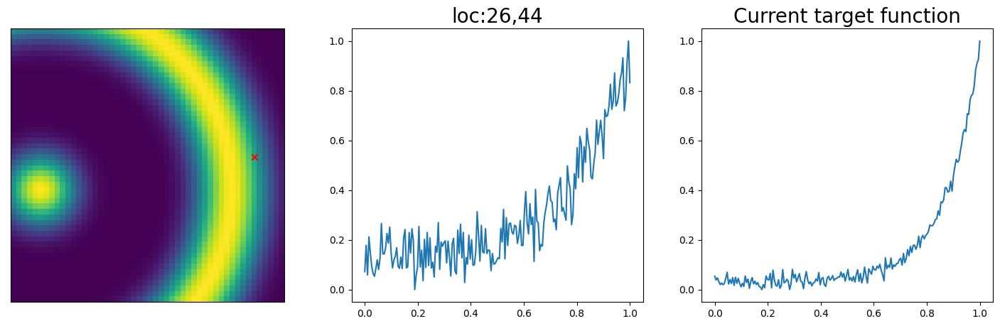

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #4


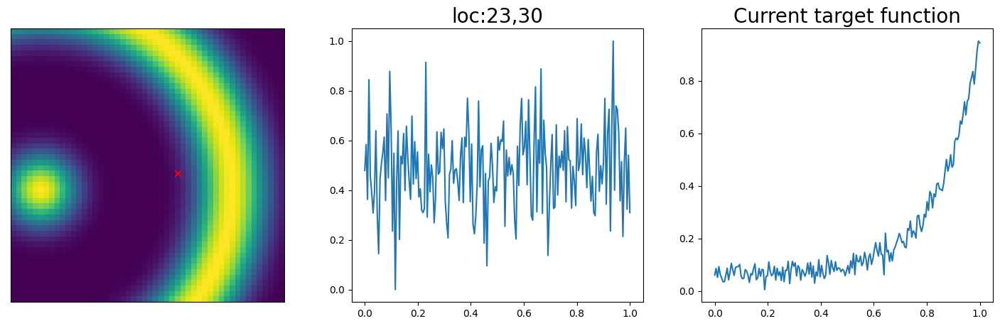

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #5


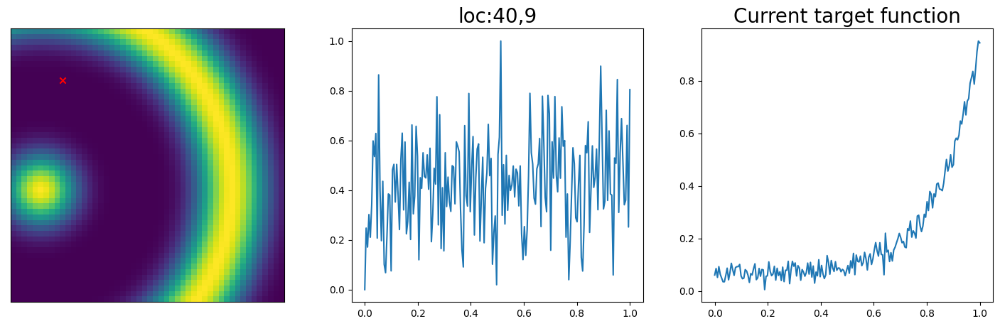

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #6


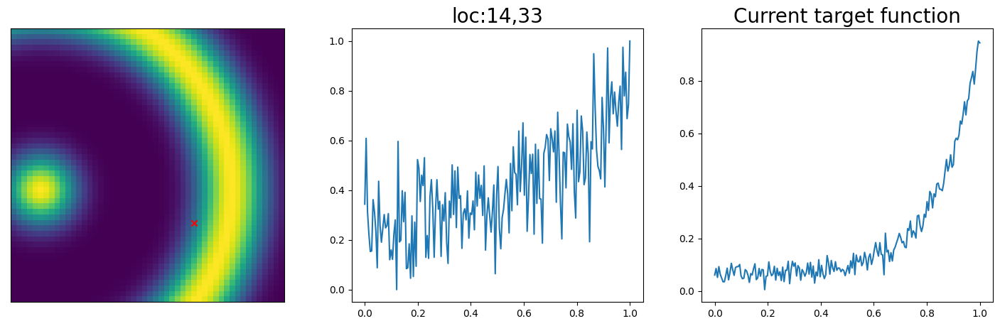

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #7


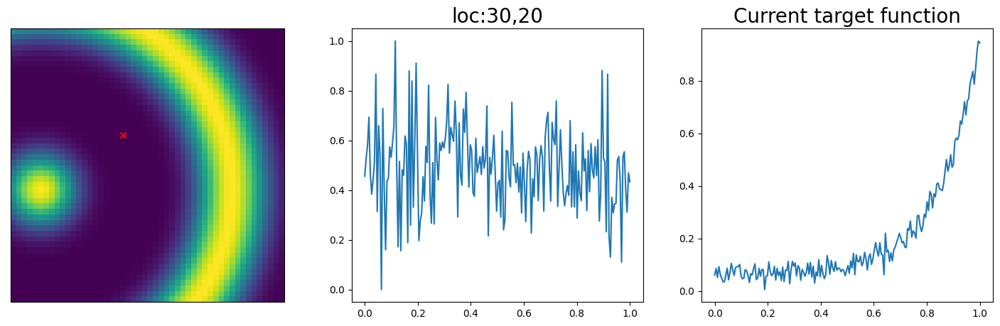

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #8


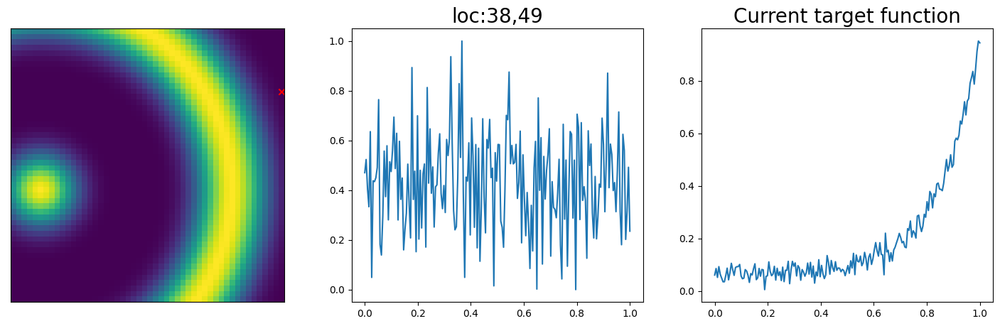

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #9


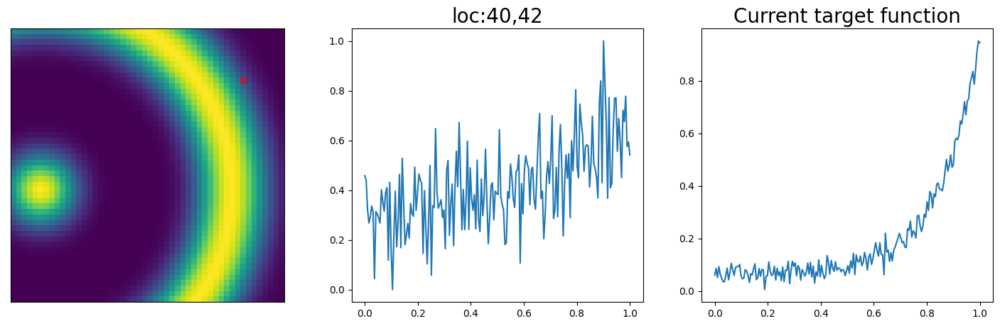

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #10


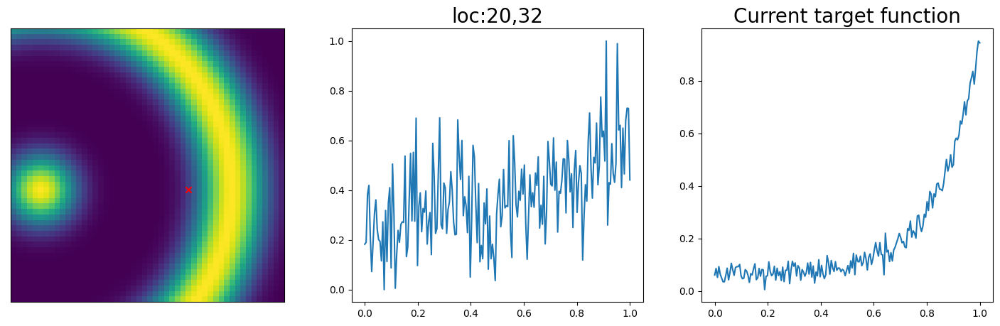

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #11


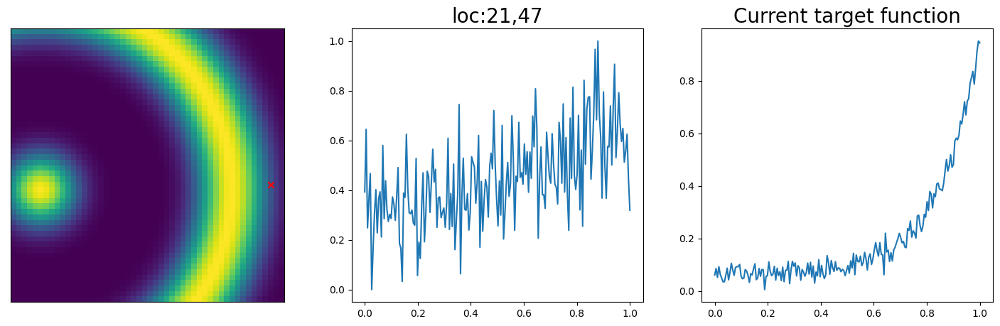

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #12


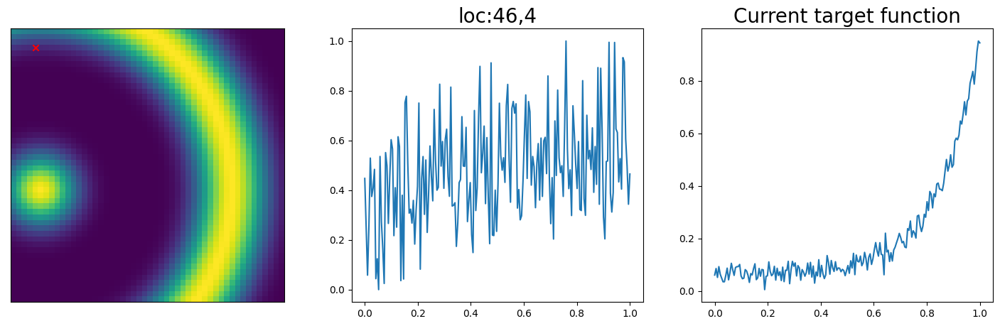

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #13


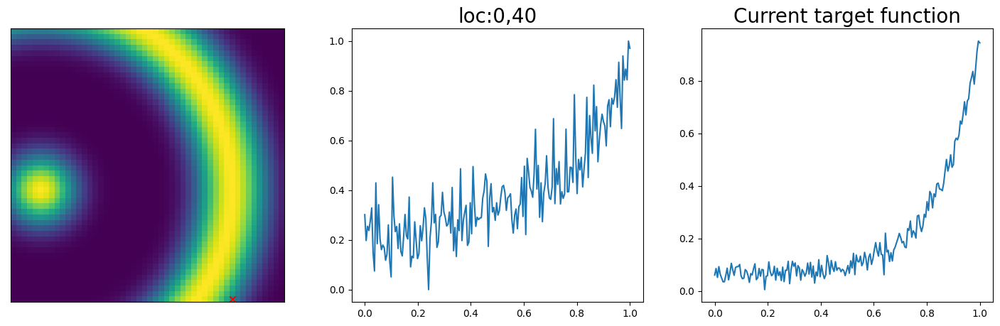

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #14


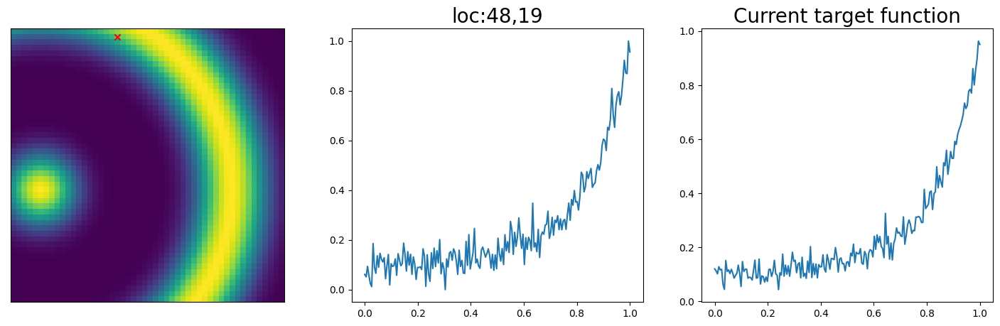

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #15


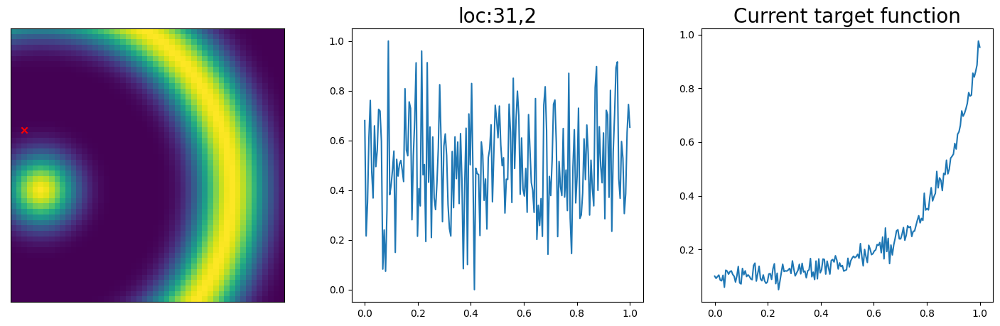

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #16


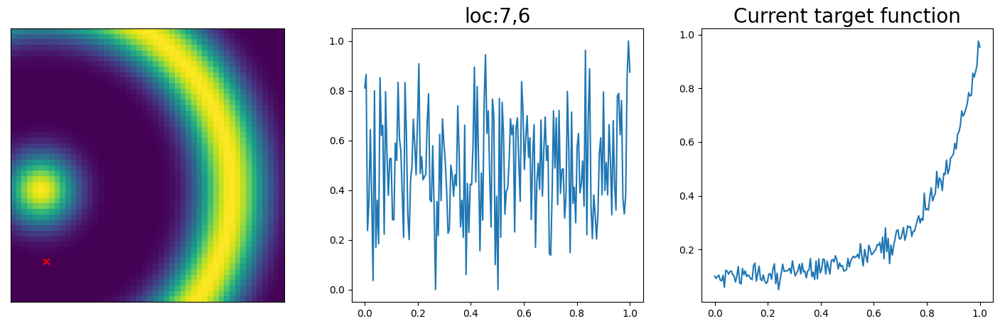

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #17


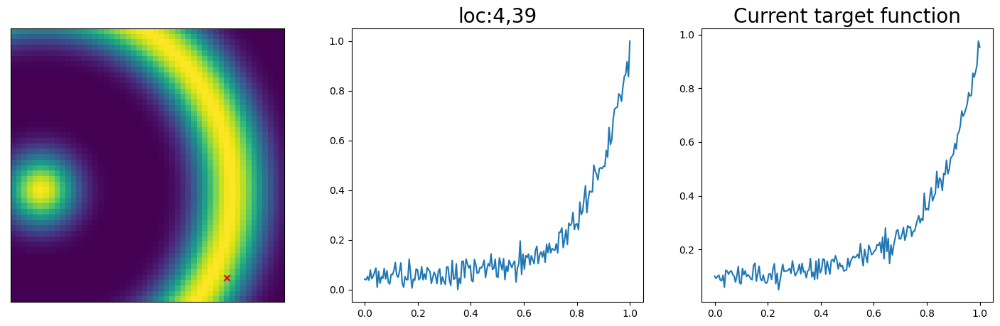

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #18


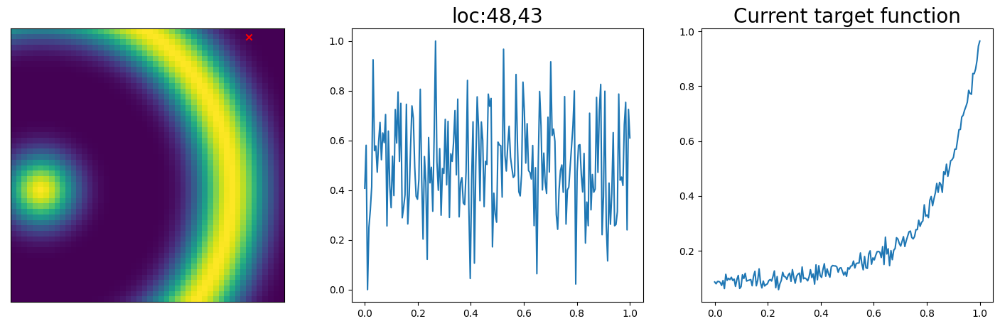

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #19


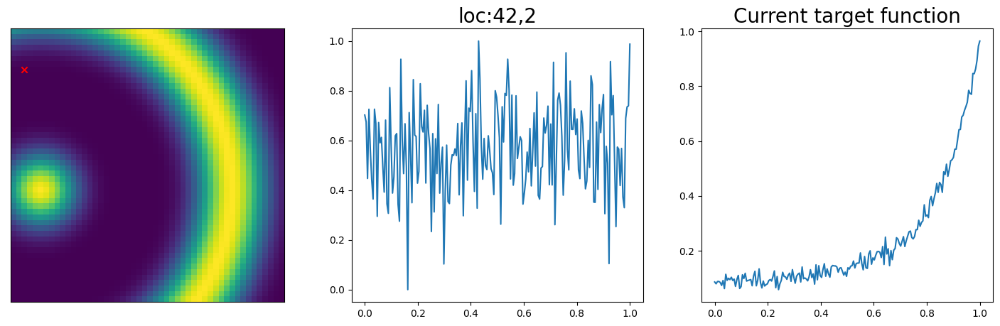

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #20


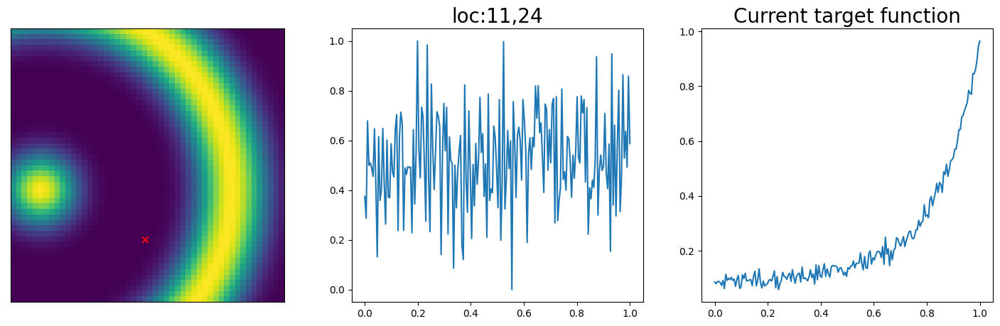

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #21


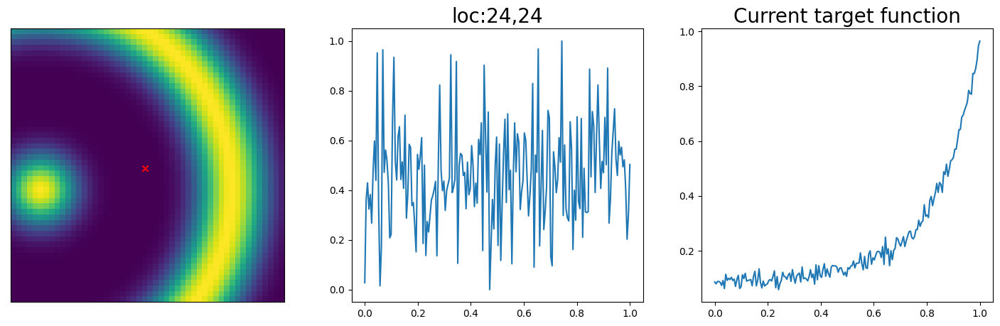

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #22


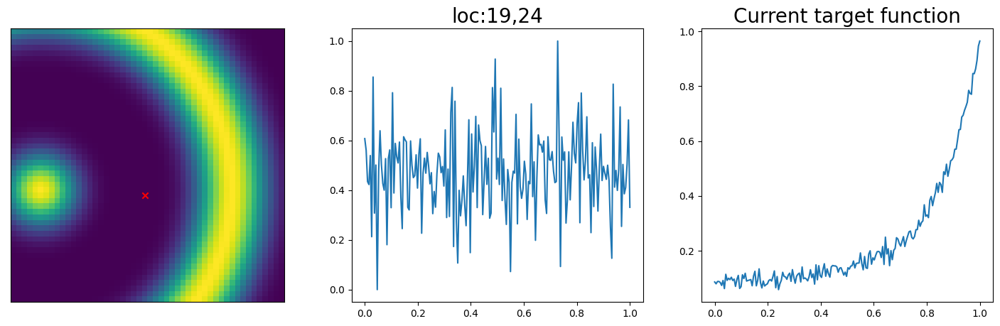

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #23


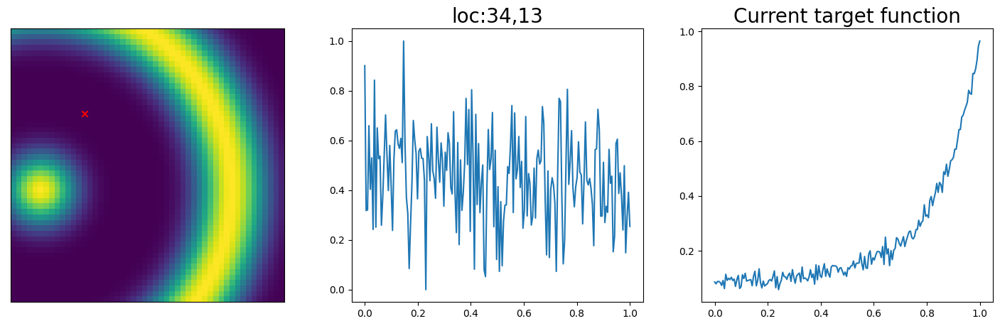

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #24


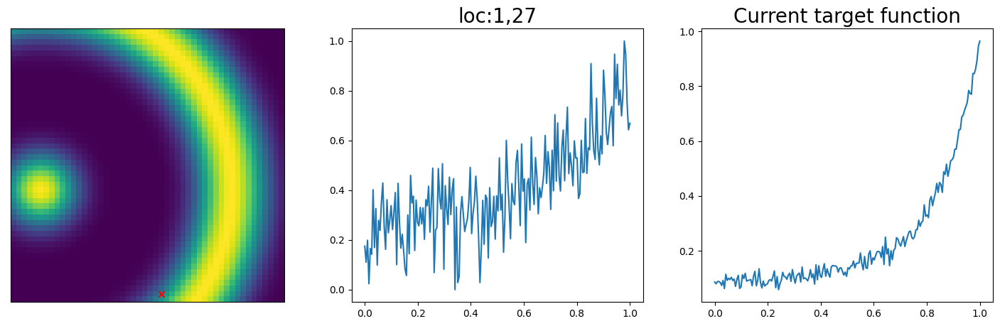

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #25


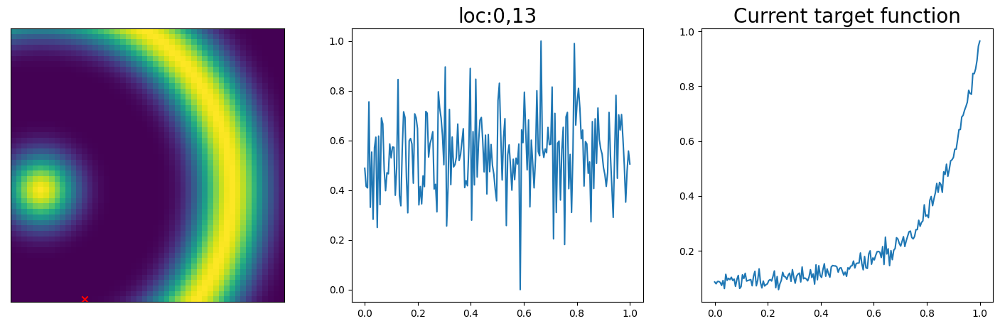

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #26


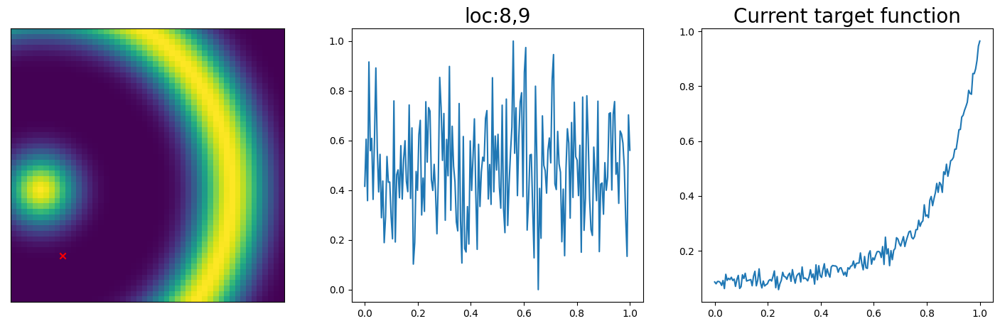

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #27


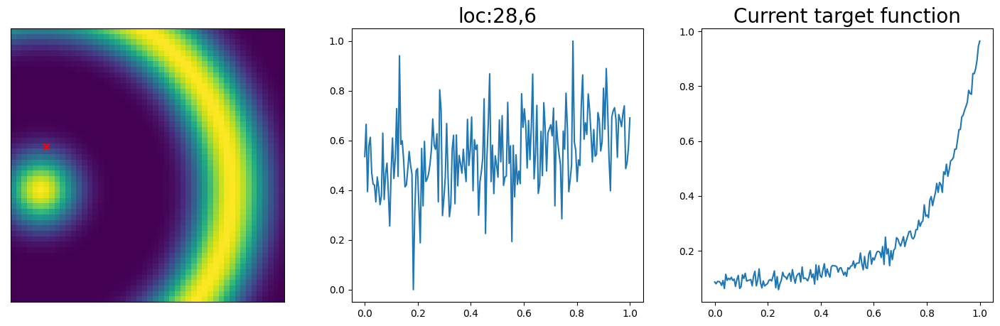

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #28


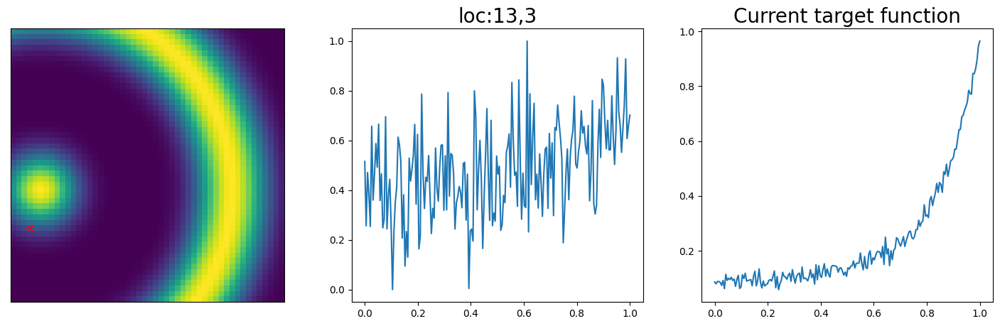

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #29


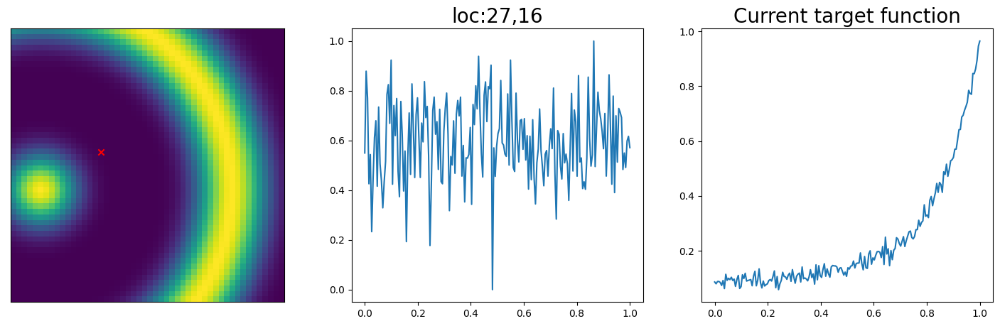

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #30


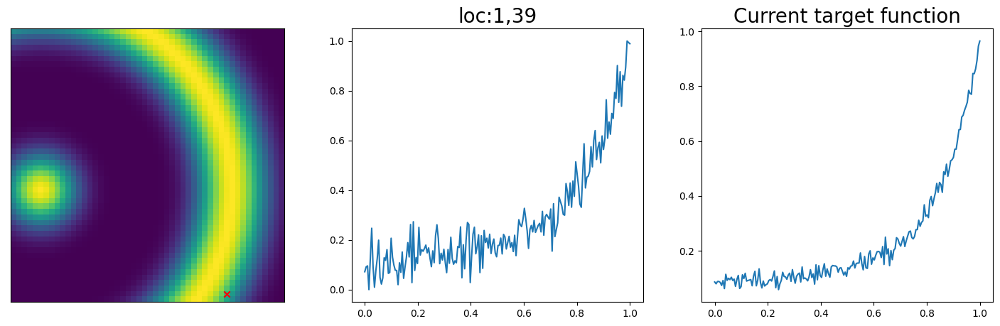

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #31


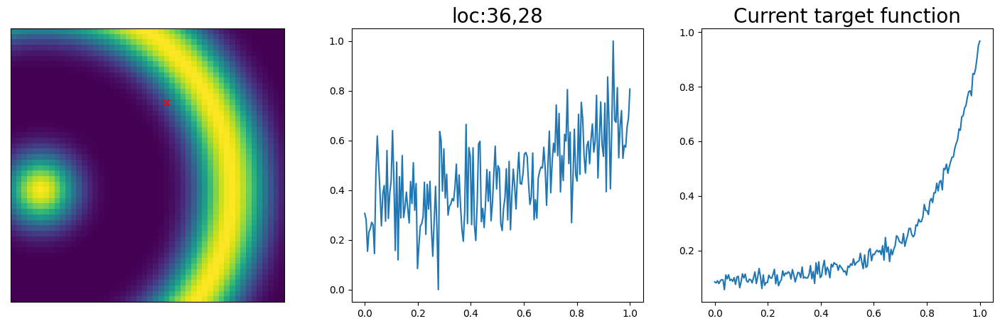

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


Sample #32


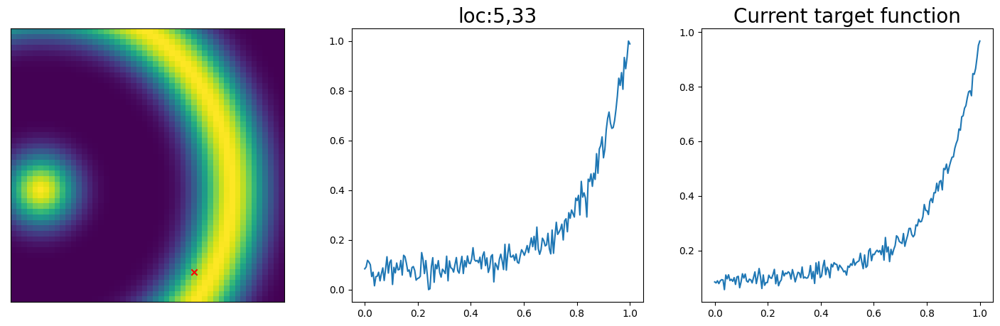

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


Sample #33


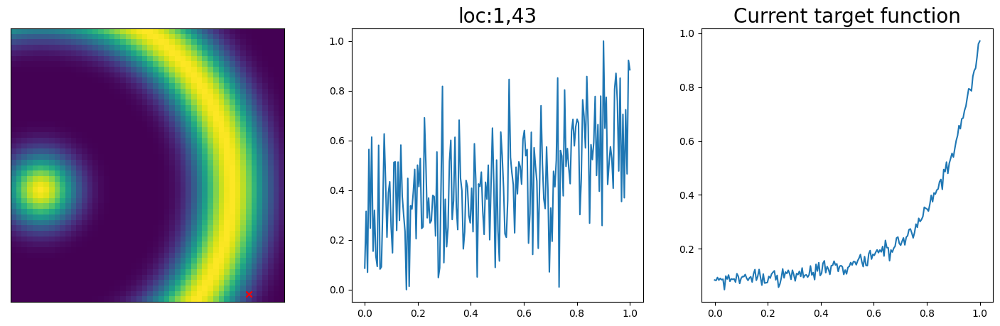

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 0


In [10]:
coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(coordinates[0][:,:2])

X_feas_norm = torch.empty((X_feas.shape[0], X_feas.shape[1]))

# Normalize X
for i in range(0, X_feas.shape[1]):
  X_feas_norm[:, i] = (X_feas[:, i] -
                       torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) -
                                                                  torch.min(X_feas[:, i]))

# set parameters
num_start = int(33)
N = int(100)
m = 0
spec_length = 64*3  #spectral data length


# initial train location
np.random.seed(10)
idx = np.random.randint(0, len(X_feas), num_start)
train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]

train_Y = torch.empty((num_start, 1))
pref = torch.empty((num_start, 1))
init_spec = torch.empty((num_start, spec_length))

#Evaluate initial training data
x = torch.empty((1,2))
# First generate target loop, based on initial training data
wcount_good= 0
target_func = torch.zeros(spec_length)
for i in range(0, num_start):
  idx_x = int(train_X[i, 0])
  idx_y = int(train_X[i, 1])

  ##******************experiment start*******************##
  new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx_x, idx_y)
  new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
  ##******************experiment end**********************##

  init_spec[i,] = new_spec_y
  print("\n\nSample #" + str(m + 1))
  pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y,
                                                            img, wcount_good, target_func)
  m = m + 1

# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  x[0, 0] = train_X[i, 0]
  x[0, 1] = train_X[i, 1]

  #print("Function eval #" + str(m + 1))
  train_Y[i, 0] = play_varTBO.func_obj(x, new_spec_x, init_spec[i], wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m

# Initial evaluation complete. Start BO

step:  1


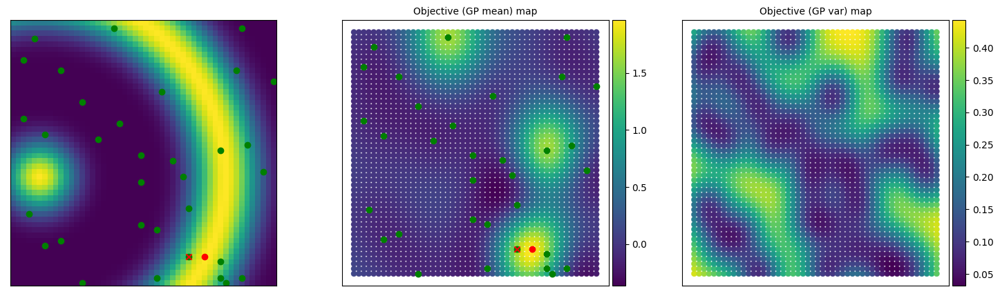



Sample #34


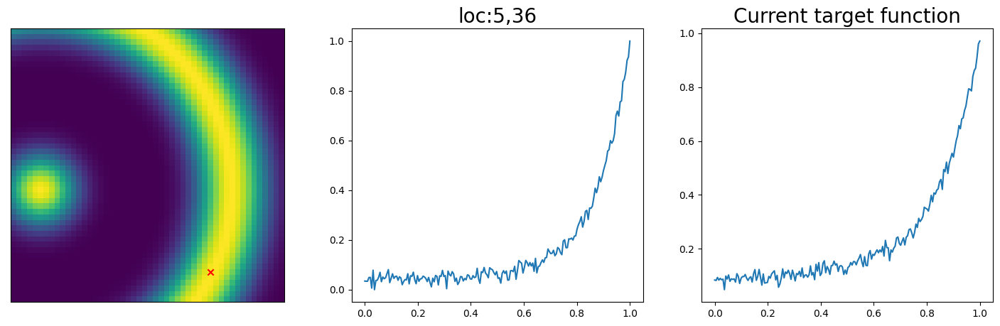

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  2


Sample #35


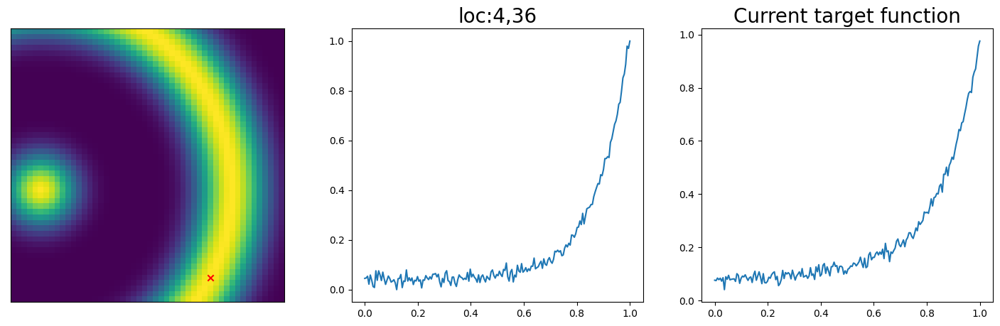

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  3


Sample #36


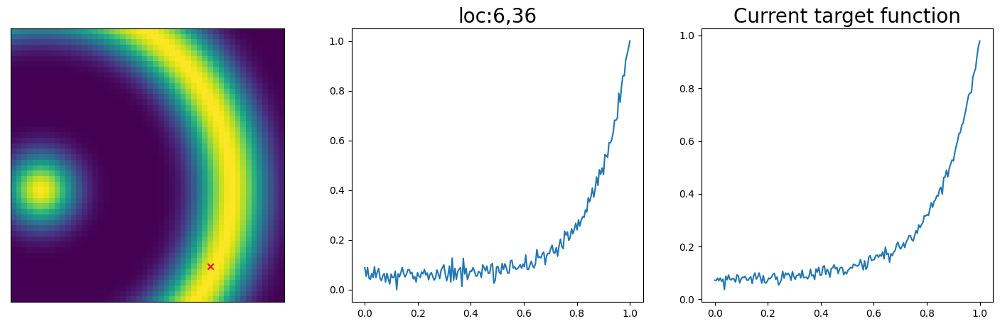

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  4


Sample #37


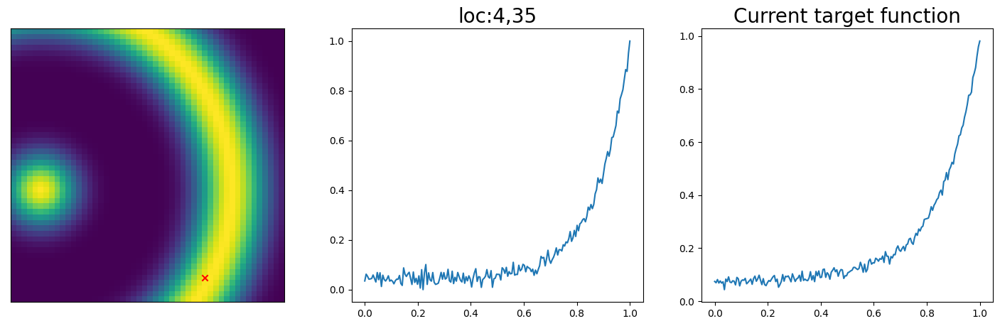

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  5


Sample #38


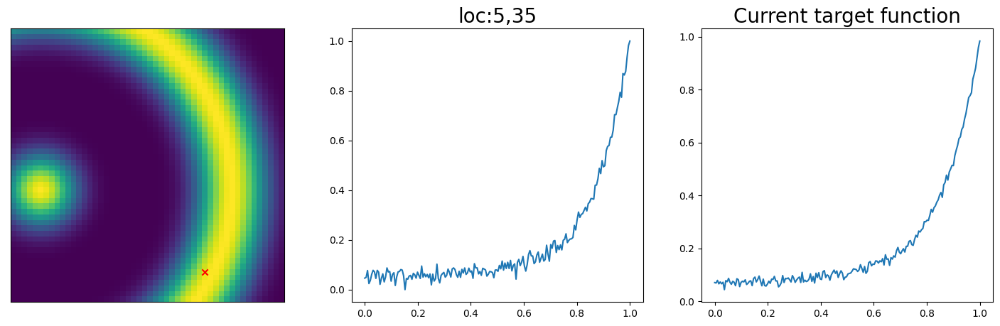

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  6


Sample #39


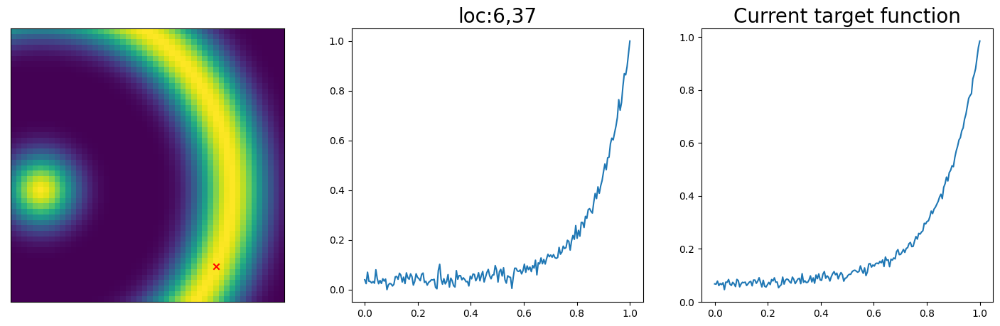

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  7


Sample #40


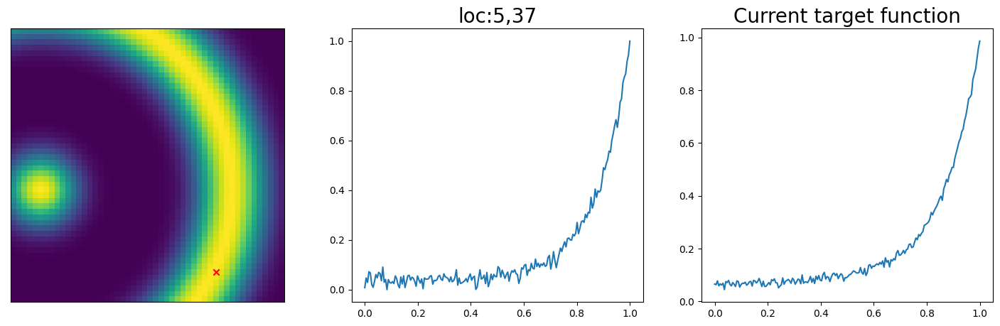

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  8


Sample #41


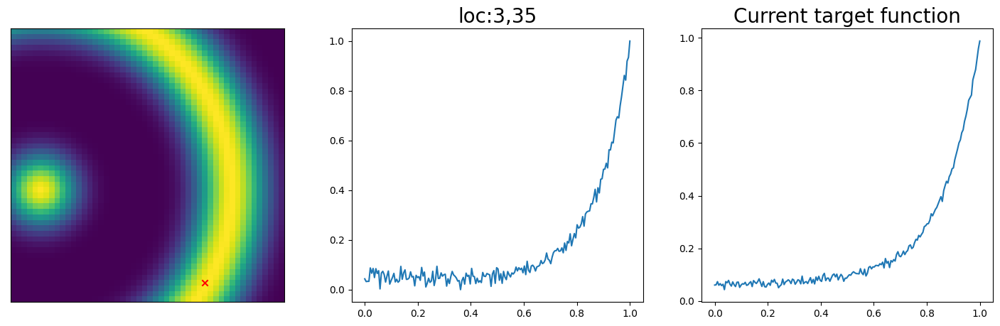

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  9


Sample #42


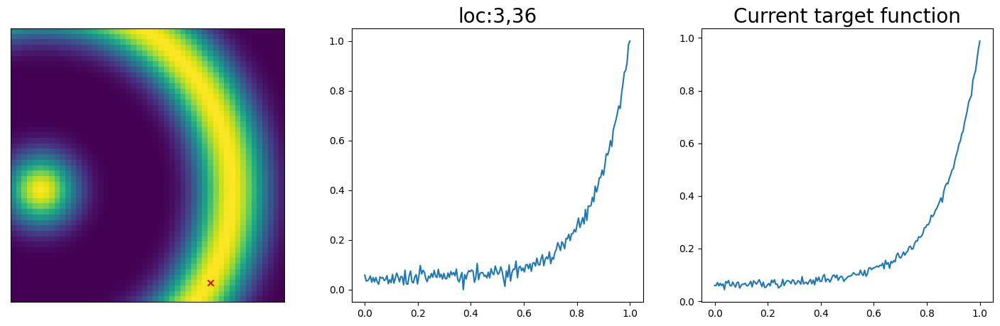

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  10


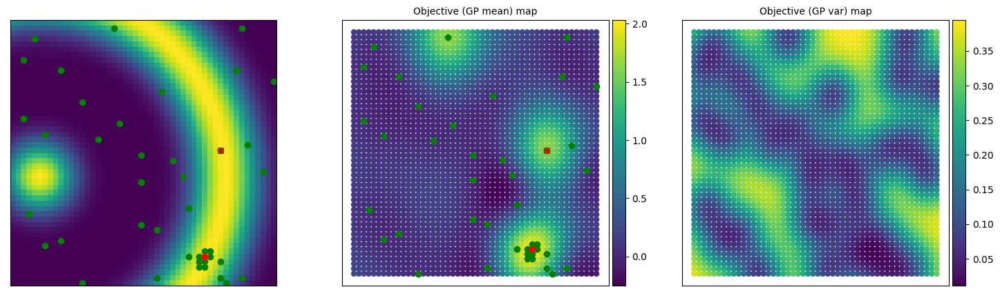



Sample #43


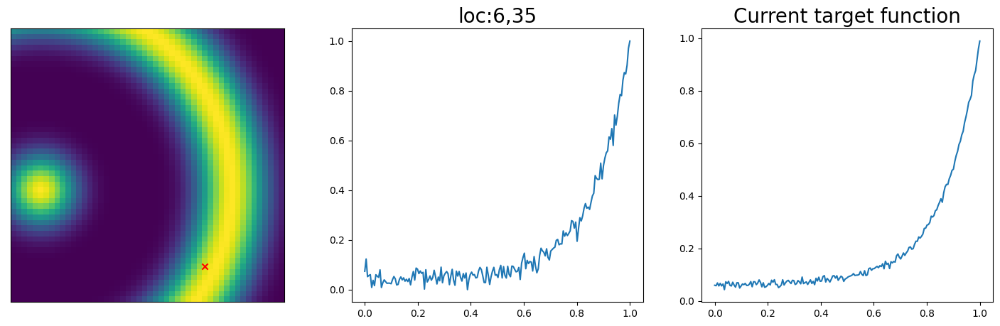

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  11


Sample #44


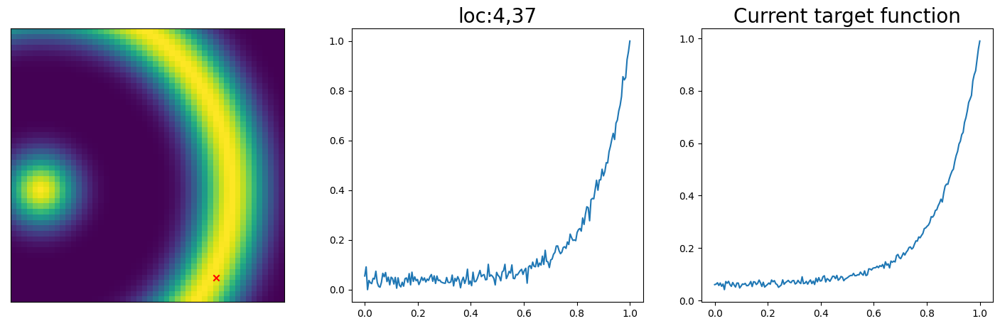

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  12


Sample #45


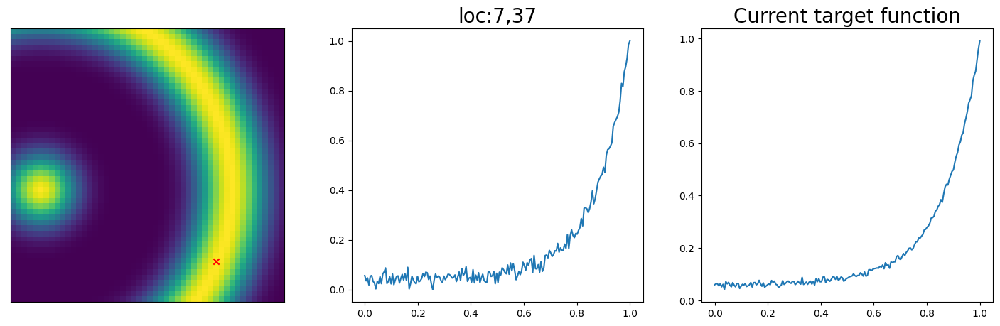

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  13


Sample #46


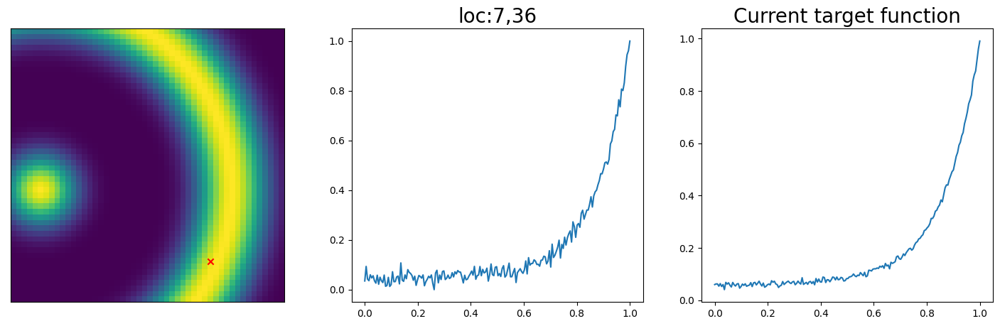

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  14


Sample #47


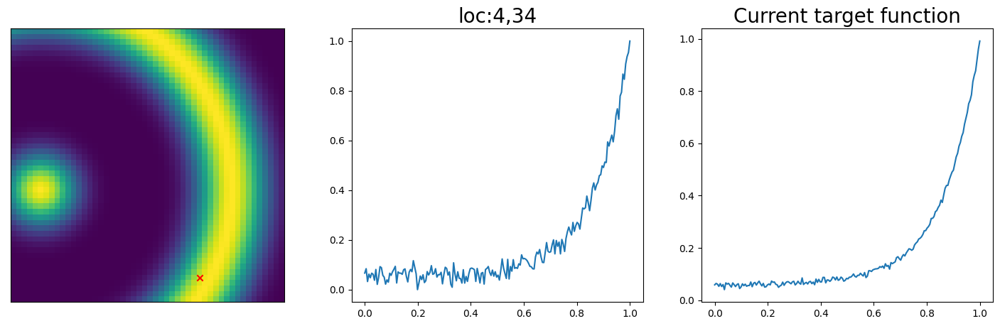

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  15


Sample #48


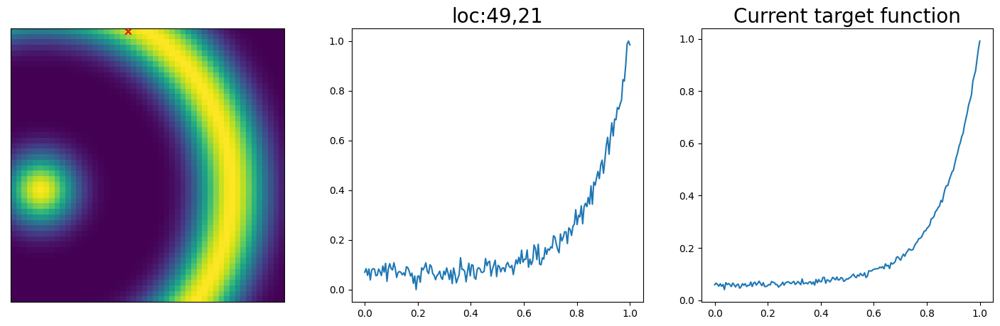

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  16


Sample #49


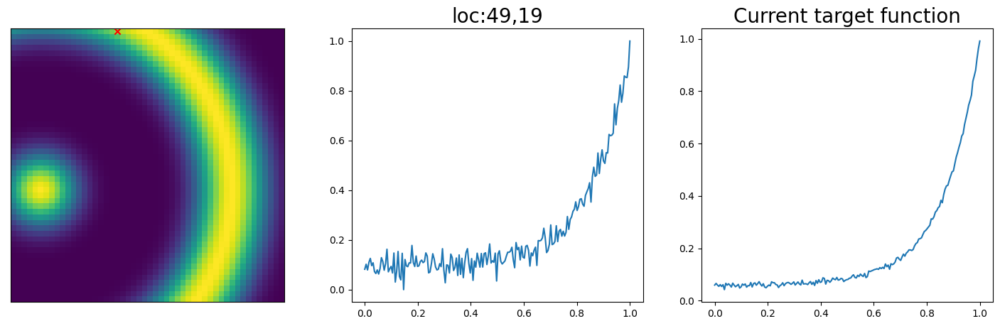

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  17


Sample #50


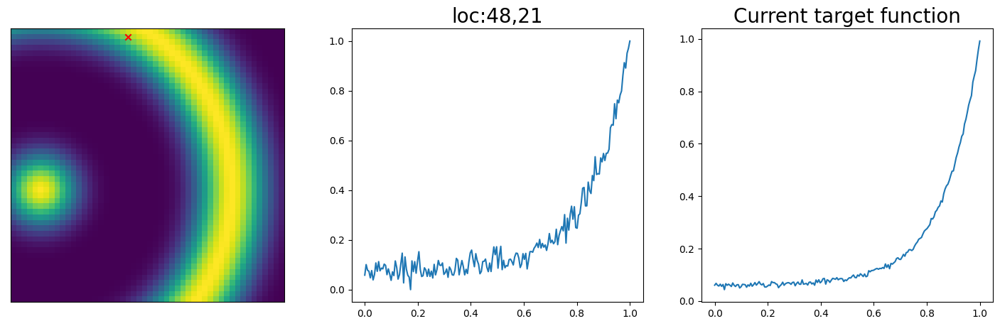

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  18


Sample #51


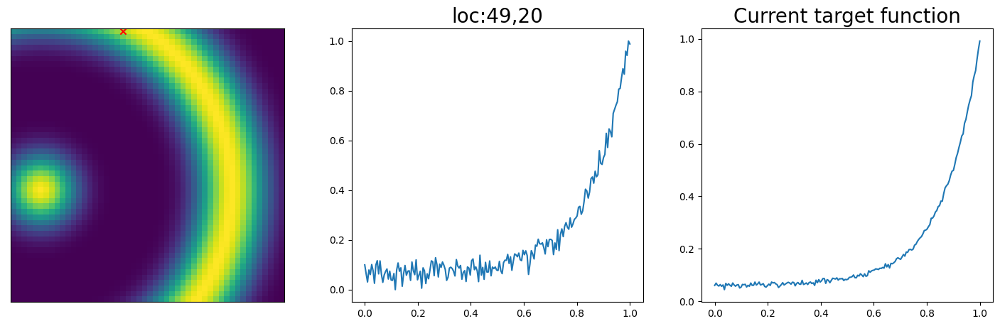

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  19


Sample #52


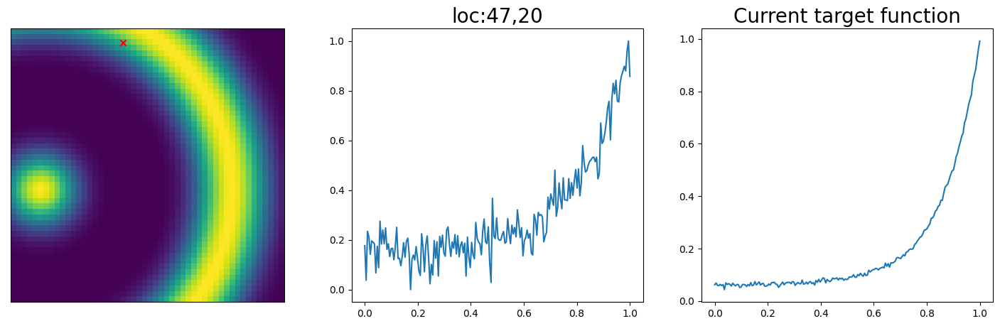

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  20


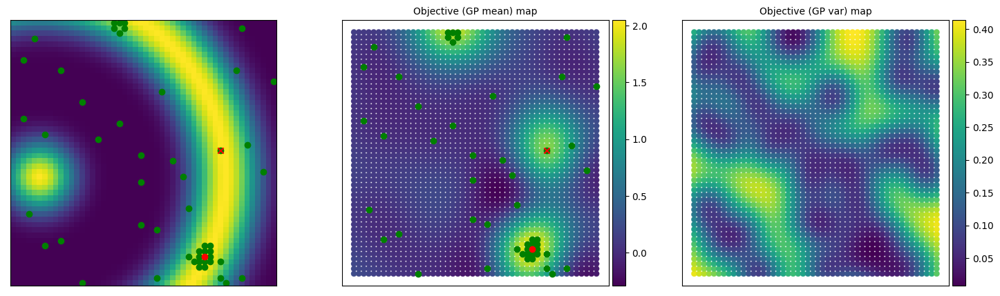



Sample #53


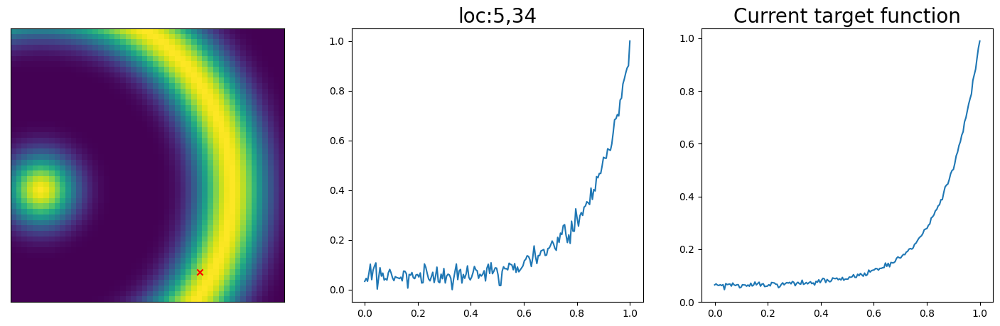

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  21


Sample #54


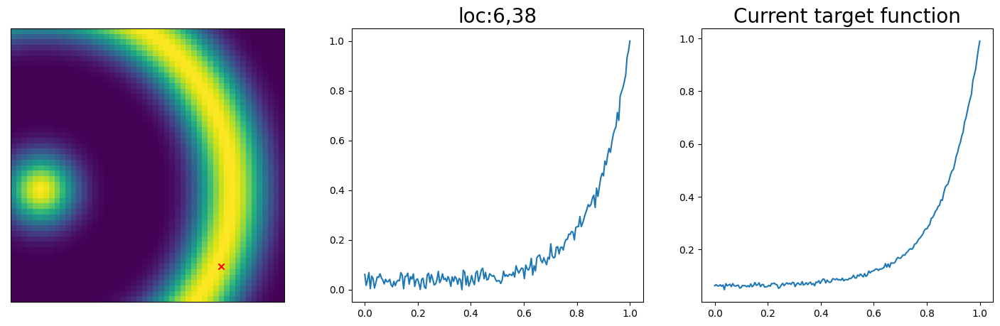

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  22


Sample #55


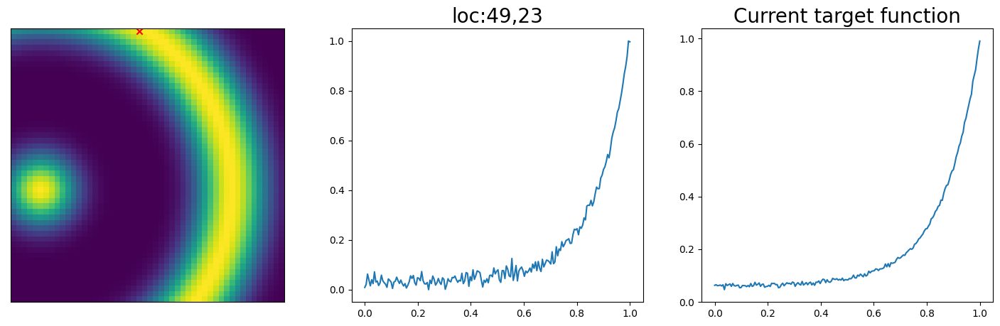

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  23


Sample #56


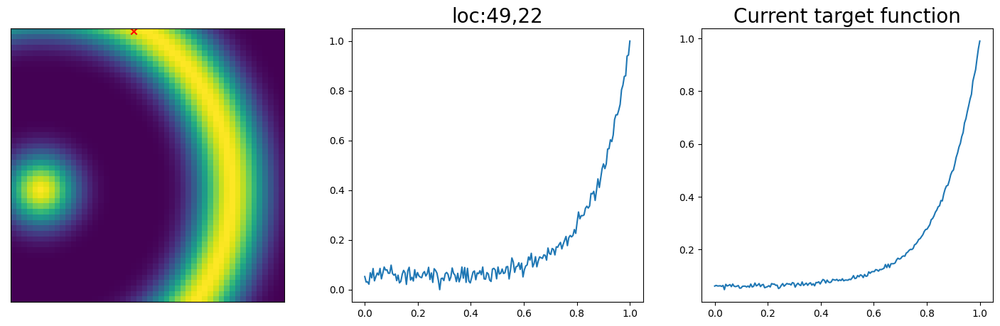

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  24


Sample #57


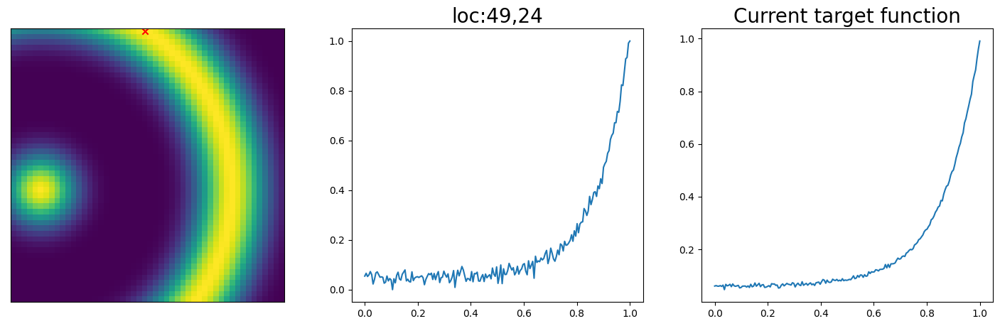

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  25


Sample #58


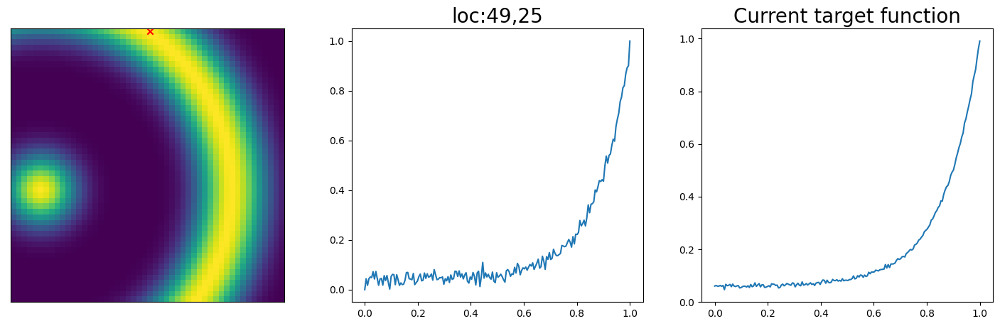

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  26


Sample #59


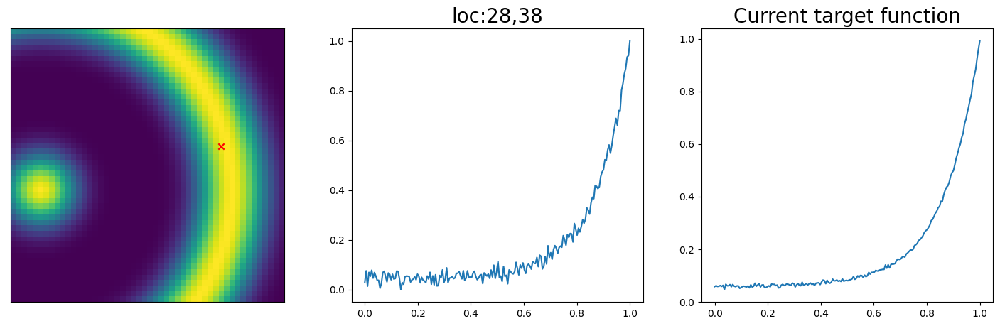

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  27


Sample #60


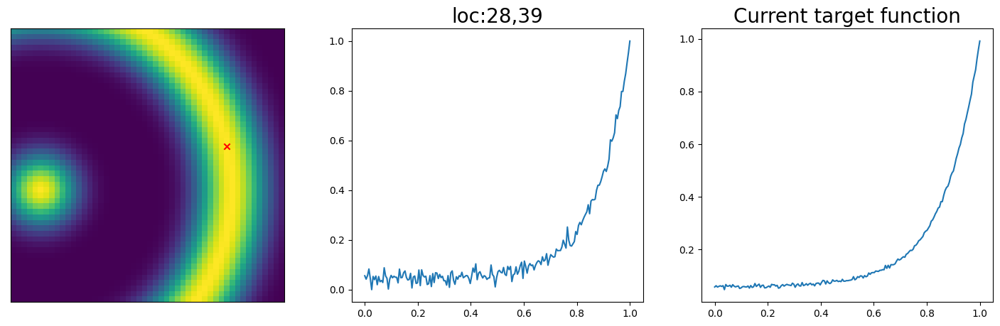

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  28


Sample #61


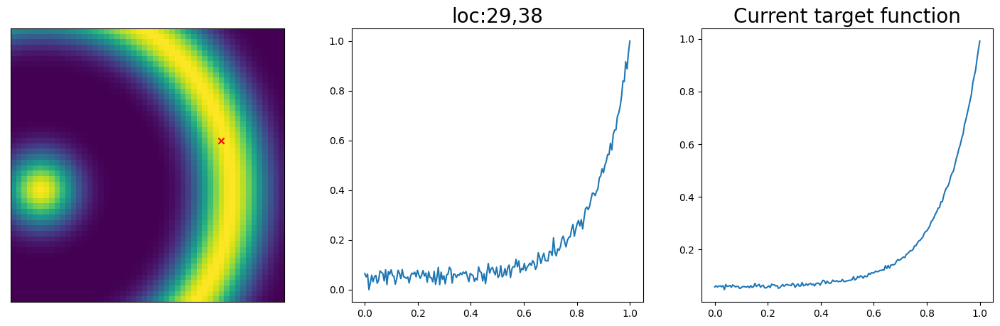

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  29


Sample #62


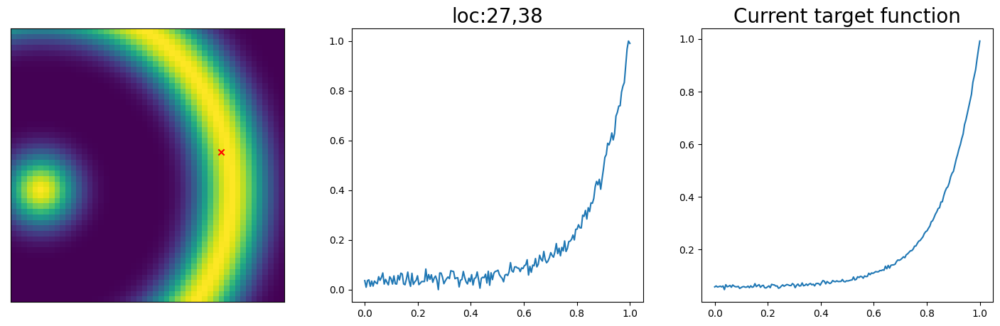

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  30


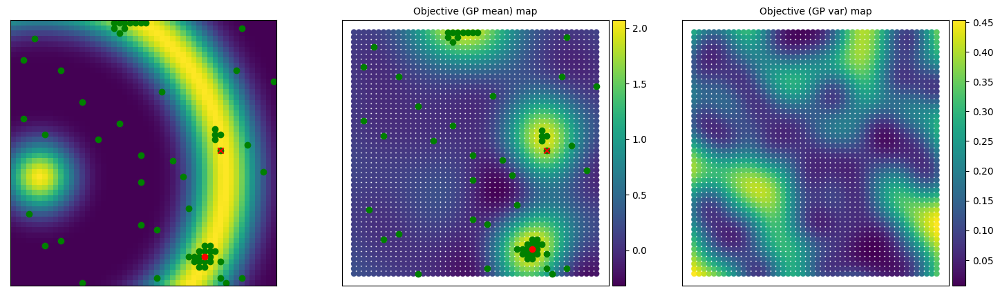



Sample #63


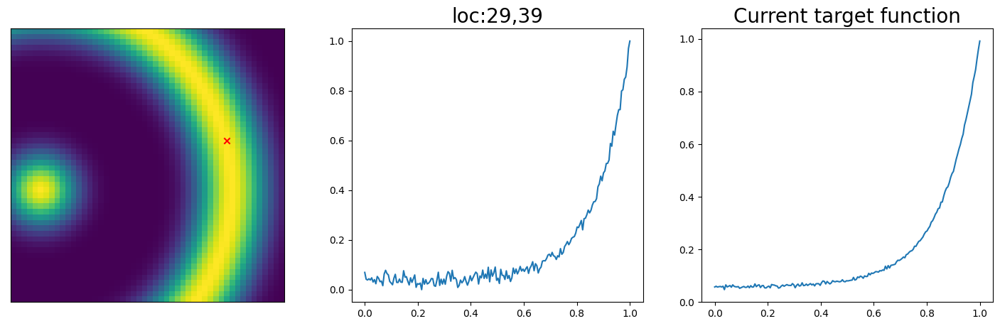

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  31


Sample #64


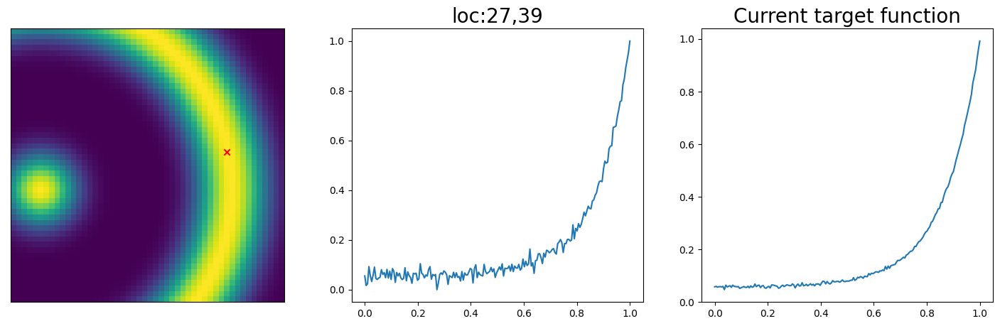

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  32


Sample #65


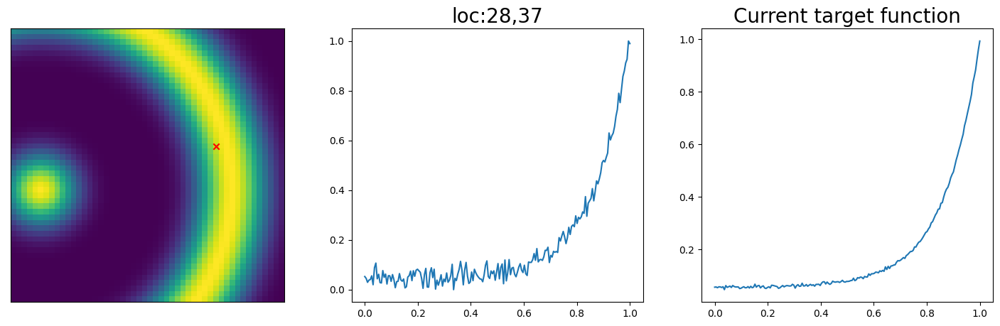

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  33


Sample #66


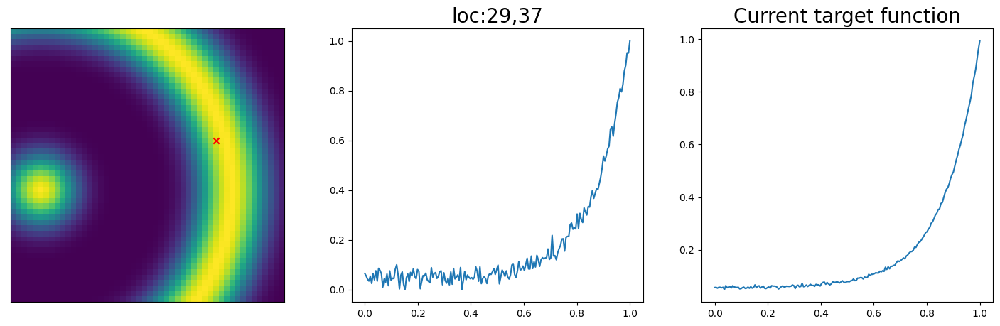

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  34


Sample #67


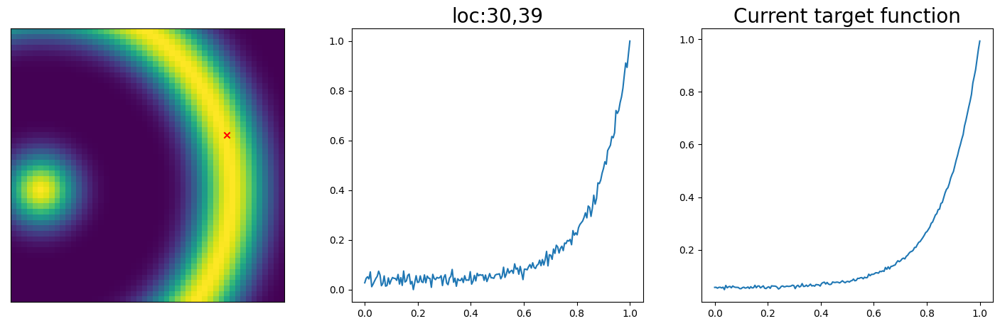

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  35


Sample #68


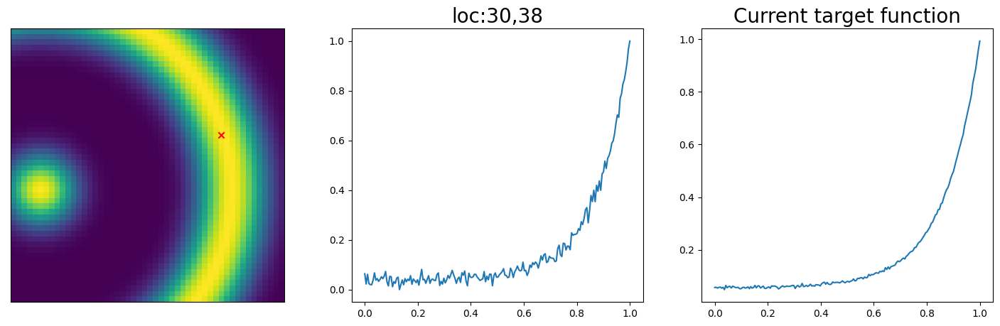

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  36


Sample #69


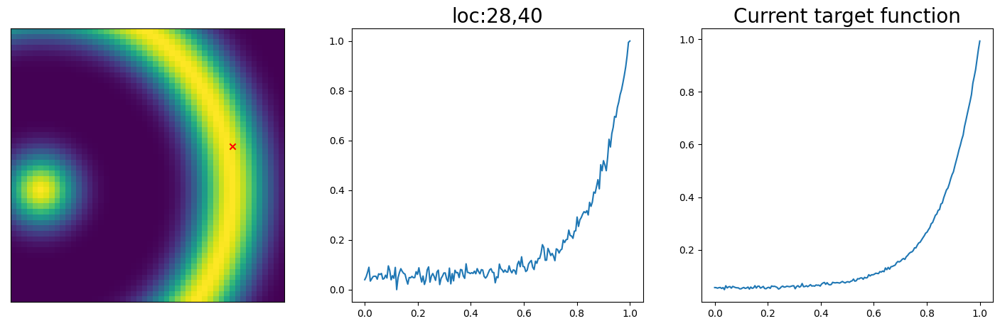

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  37


Sample #70


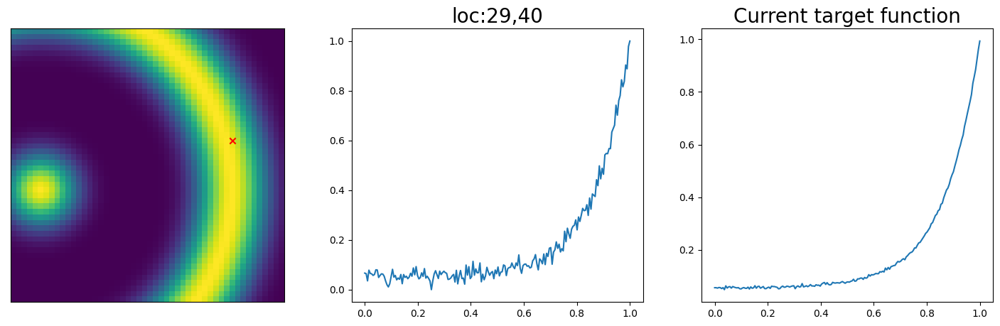

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  38


Sample #71


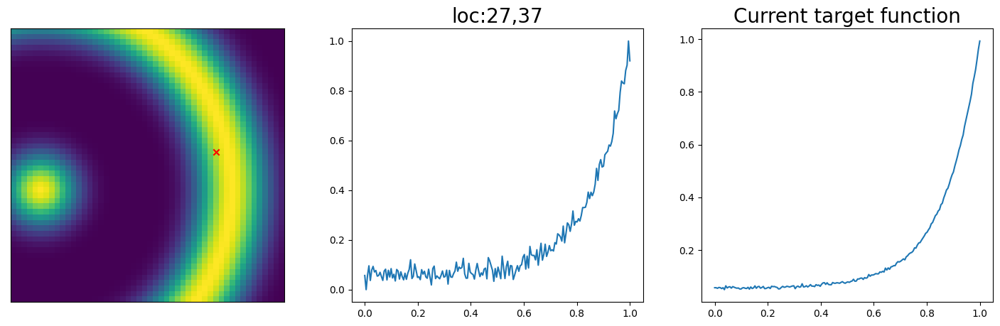

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  39


Sample #72


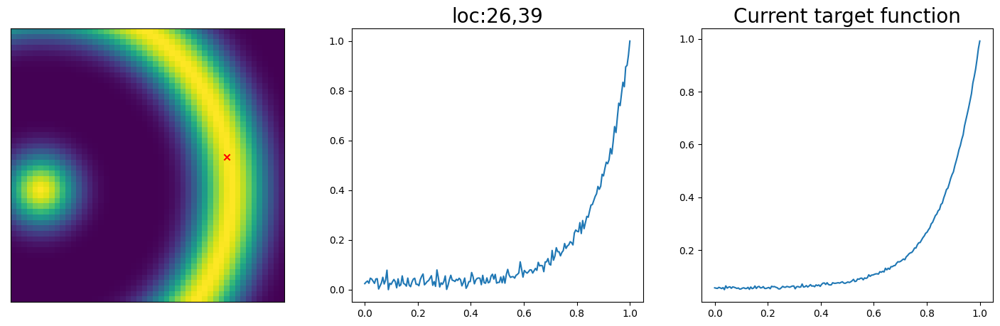

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  40


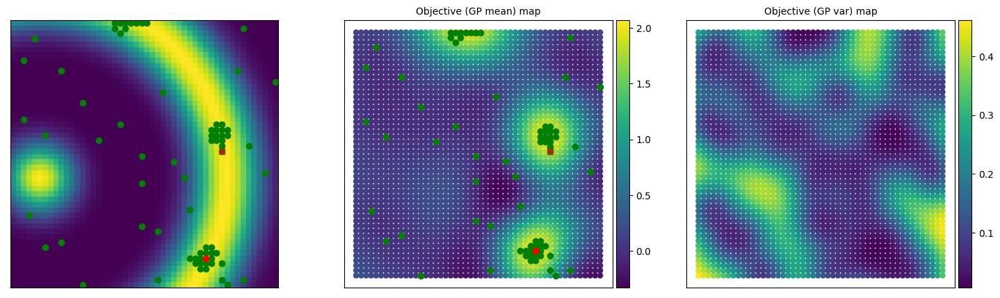



Sample #73


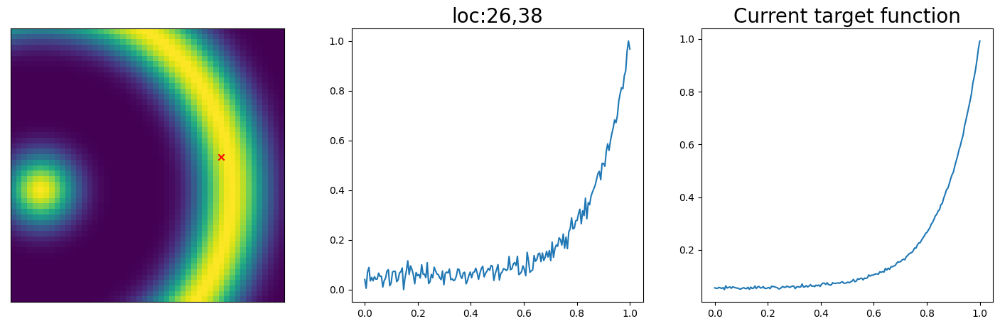

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  41


Sample #74


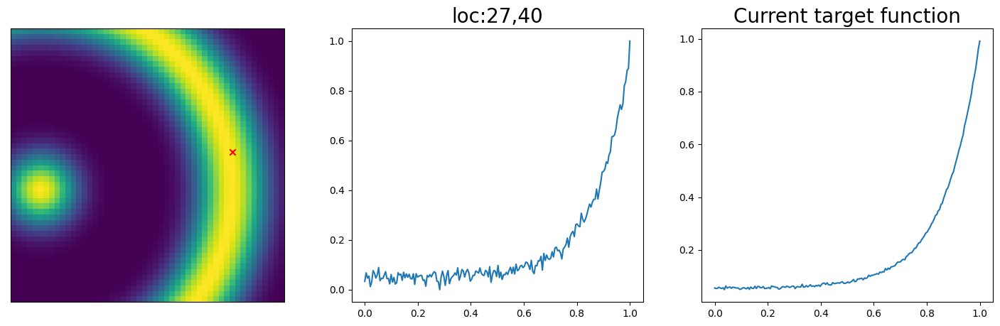

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  42


Sample #75


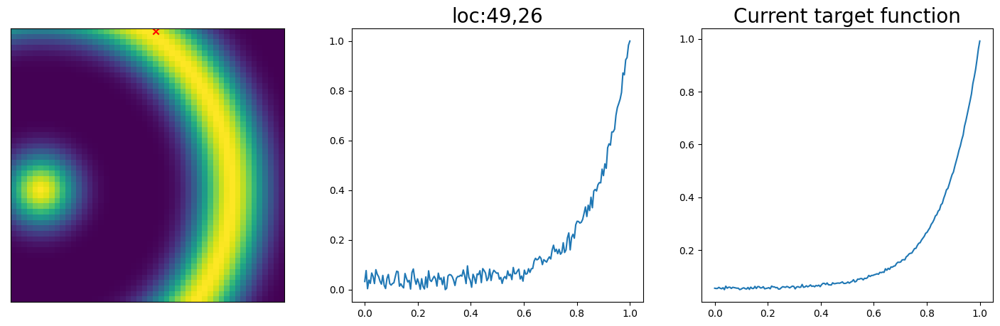

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  43


Sample #76


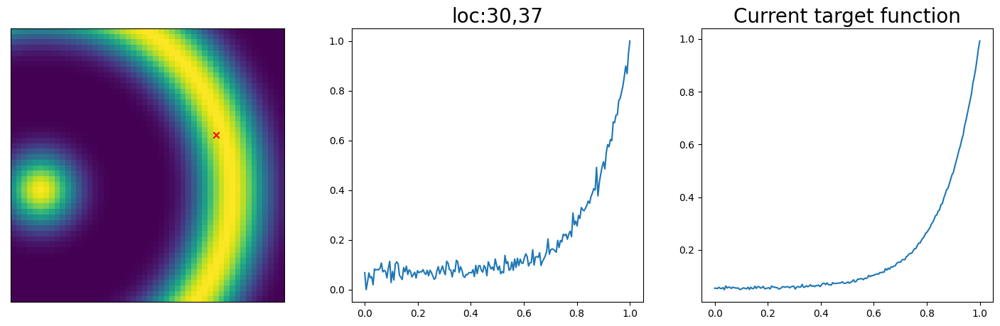

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  44


Sample #77


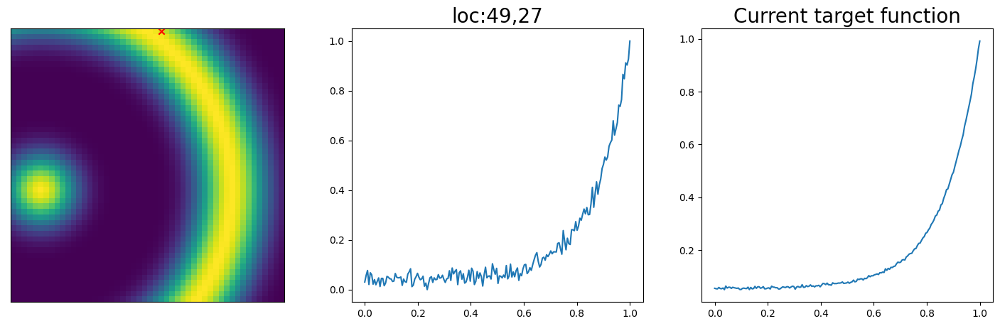

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  45


Sample #78


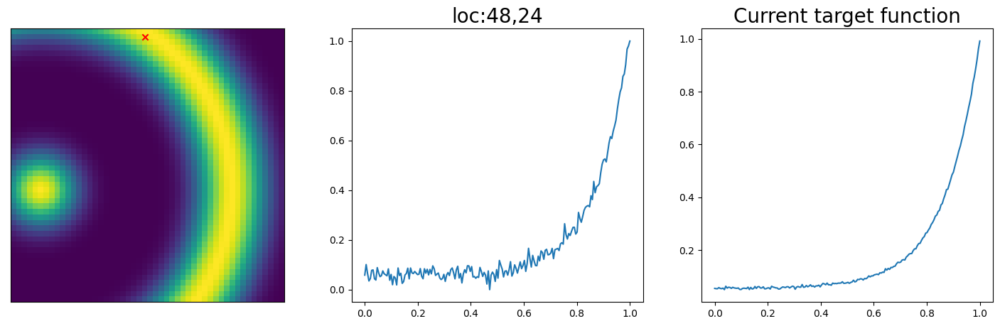

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  46


Sample #79


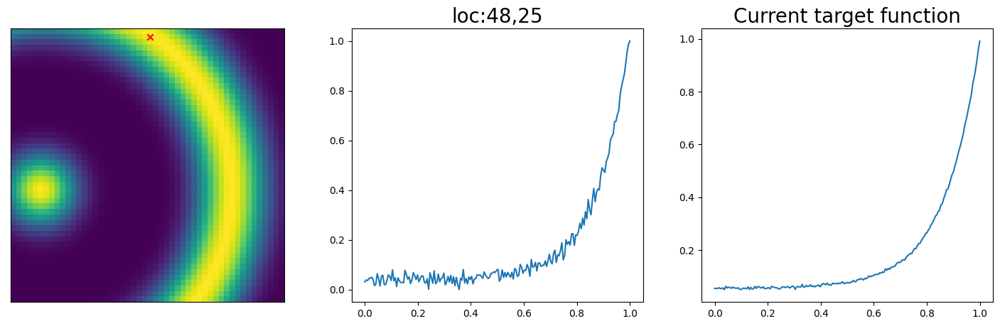

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  47


Sample #80


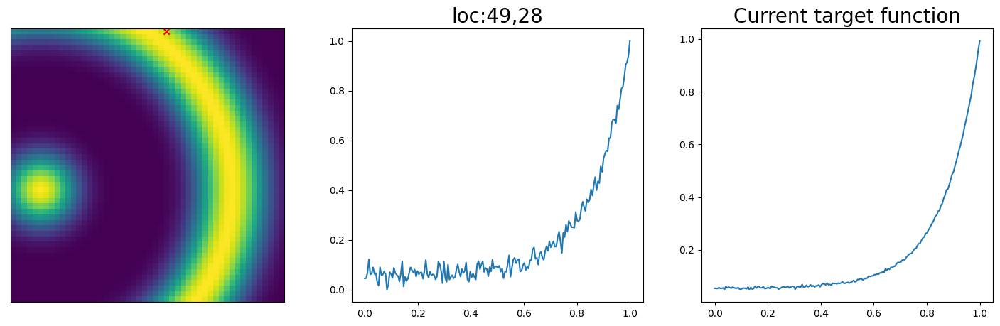

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  48


Sample #81


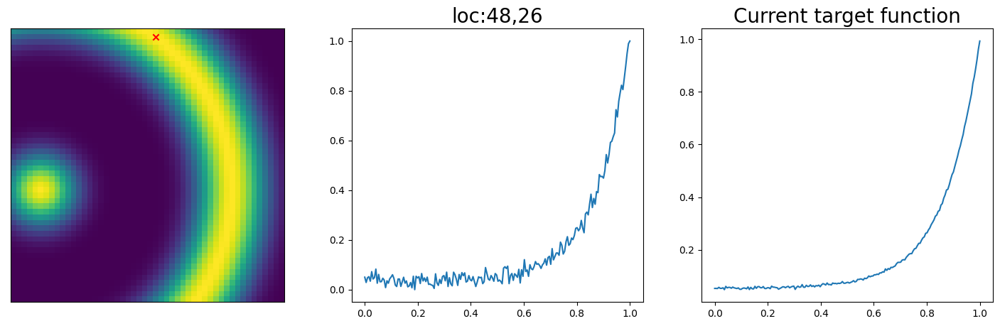

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  49


Sample #82


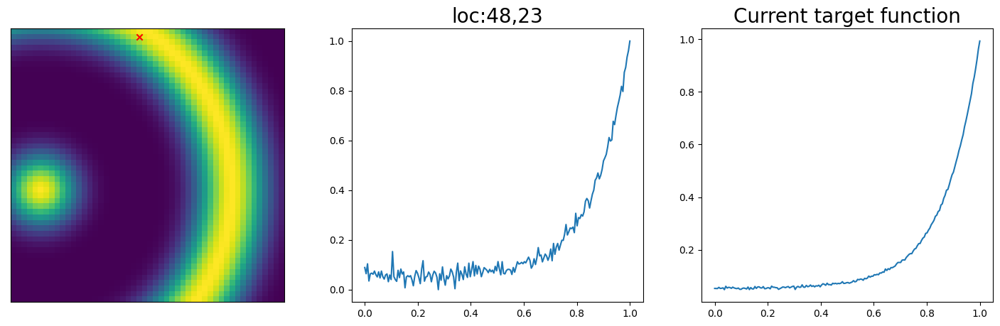

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  50


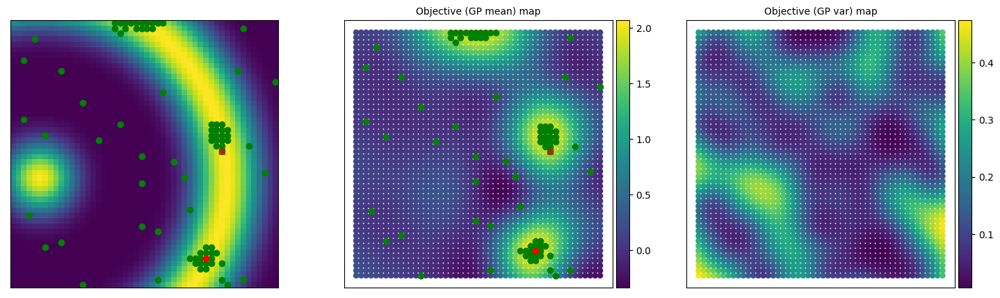



Sample #83


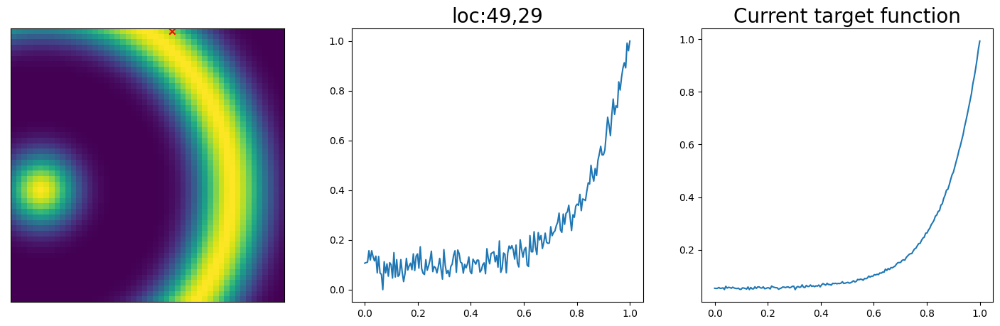

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  51


Sample #84


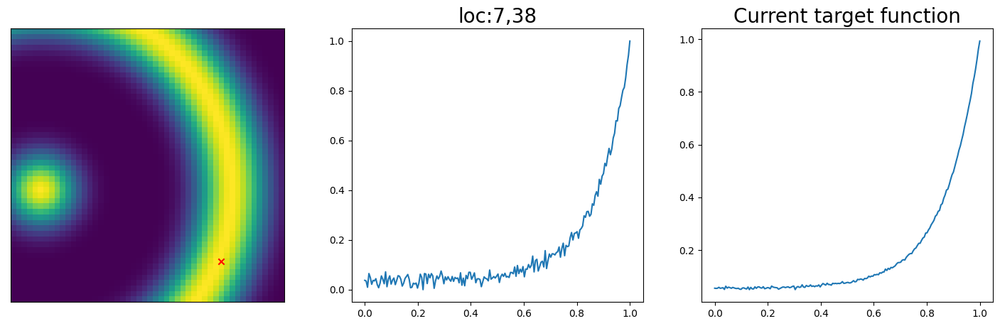

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  52


Sample #85


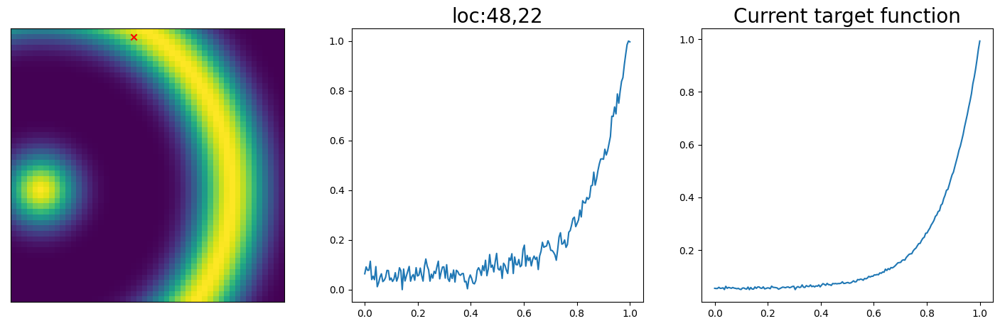

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  53


Sample #86


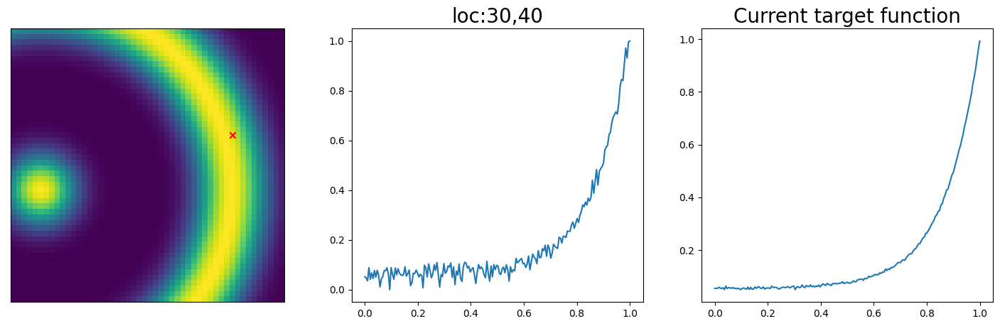

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  54


Sample #87


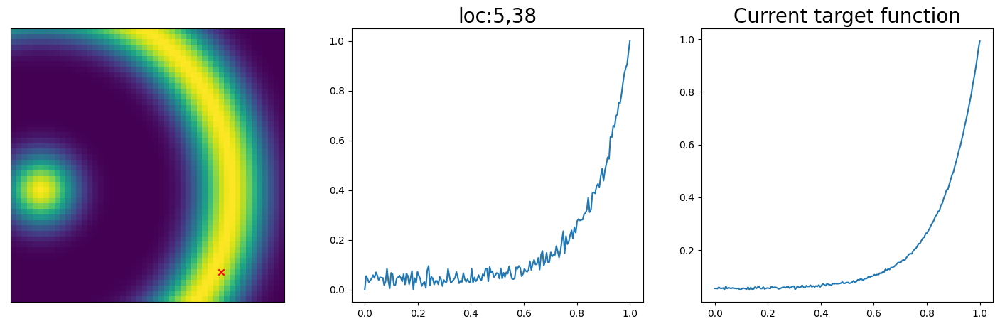

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  55


Sample #88


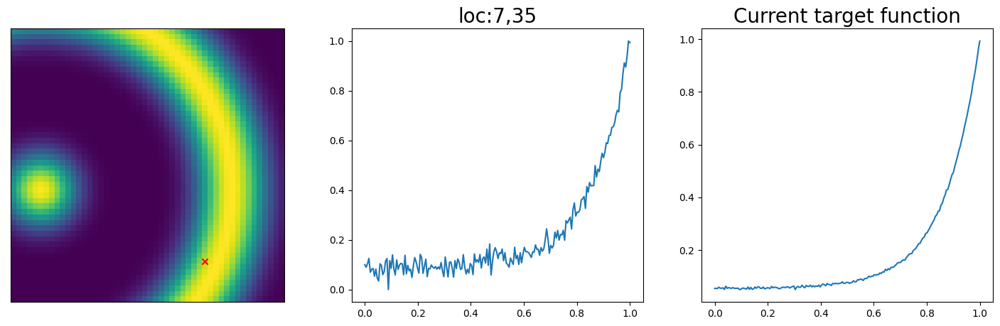

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  56


Sample #89


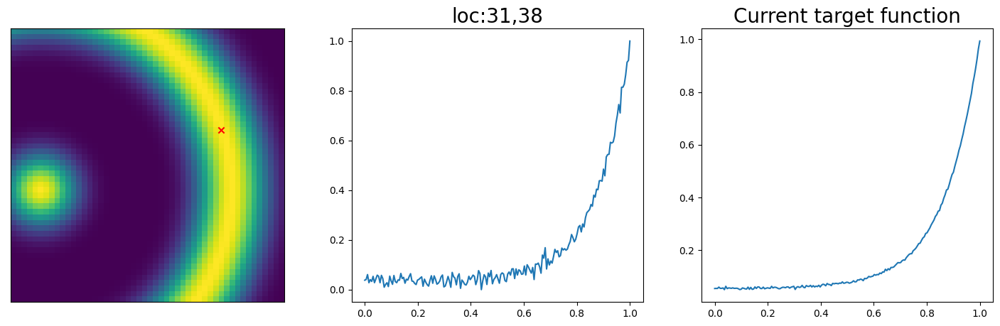

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  57


Sample #90


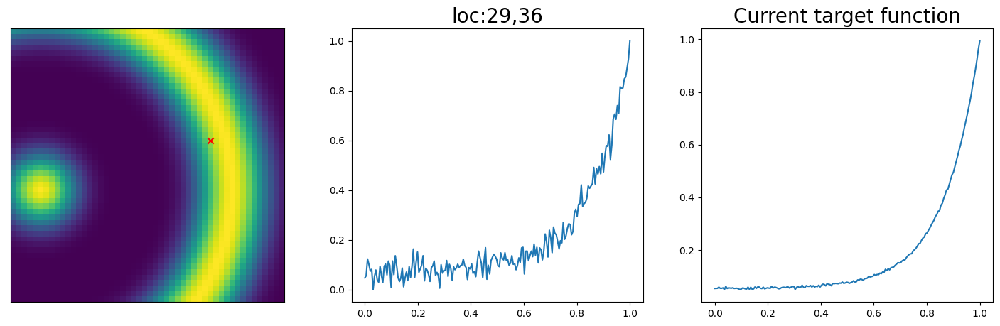

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  58


Sample #91


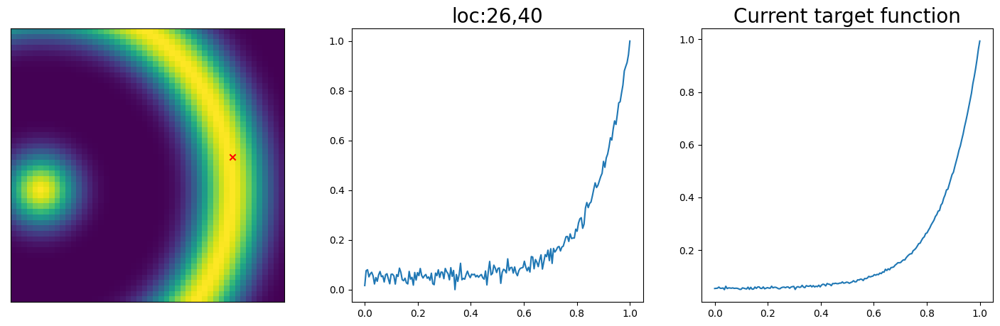

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  59


Sample #92


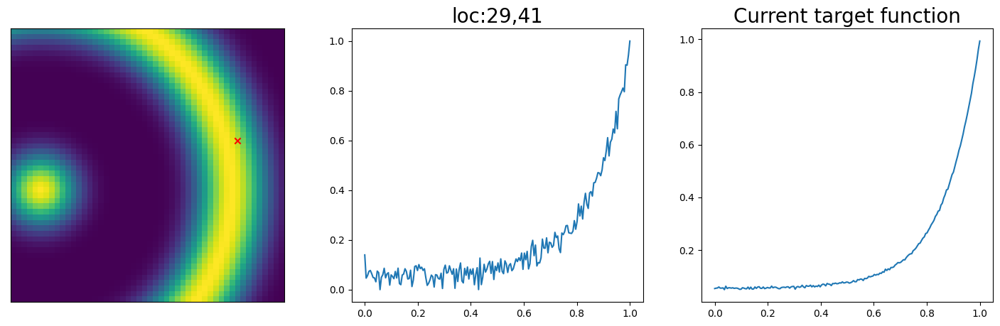

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  60


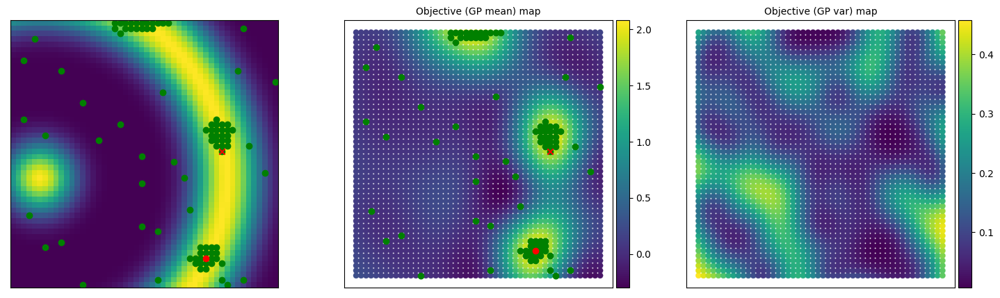



Sample #93


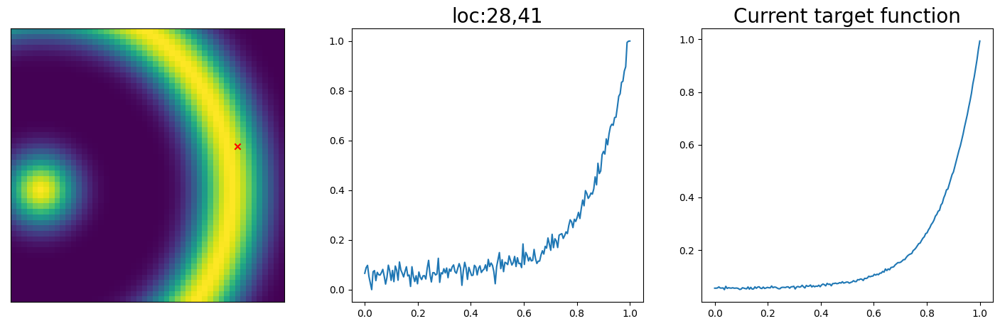

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  61


Sample #94


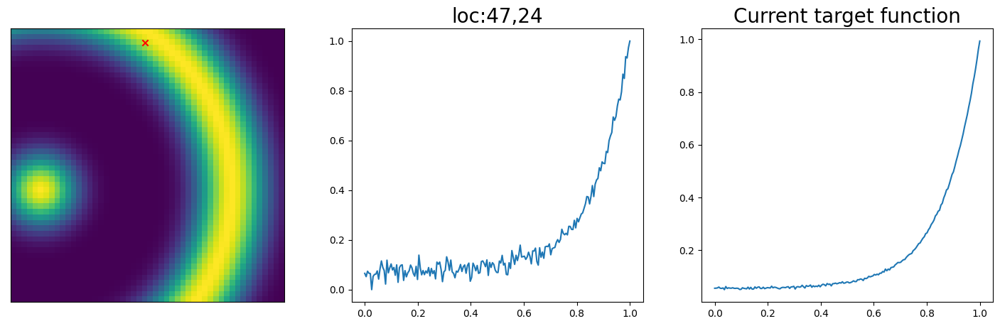

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  62


Sample #95


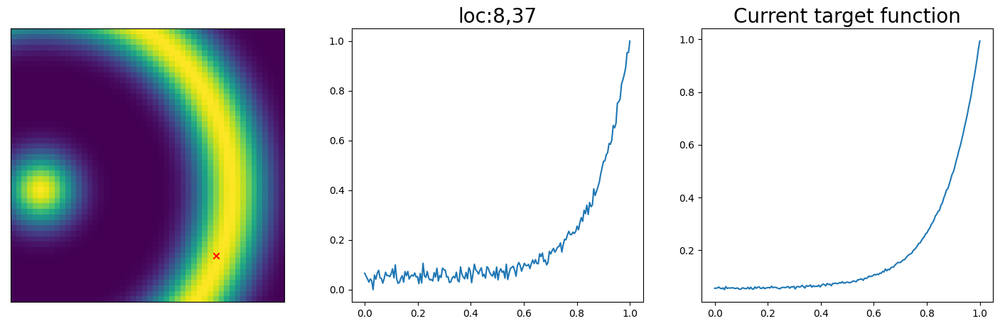

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  63


Sample #96


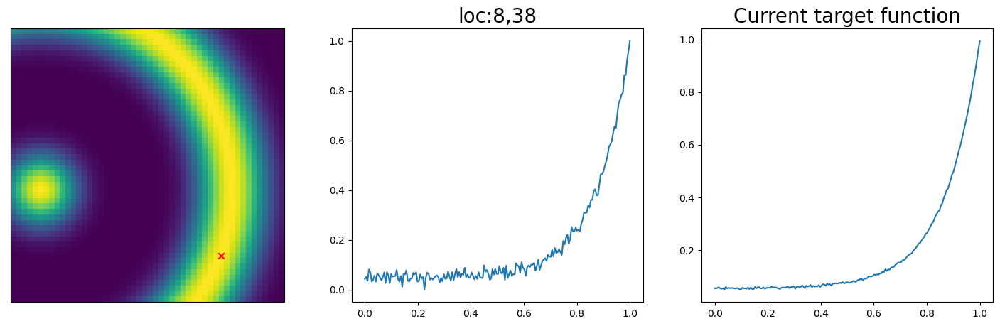

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  64


Sample #97


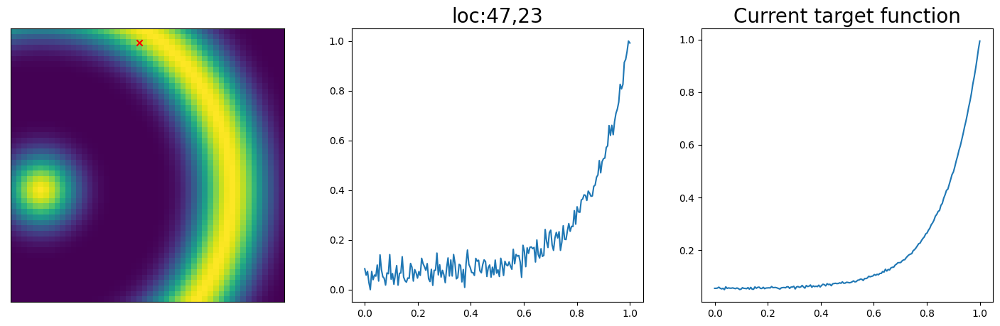

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  65


Sample #98


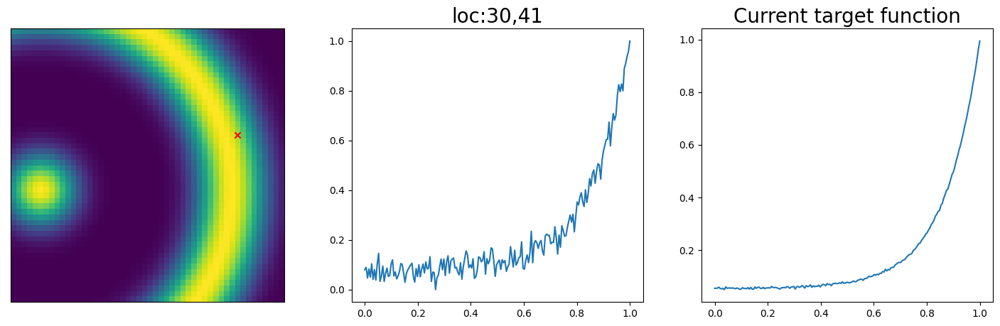

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 1
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  66


Sample #99


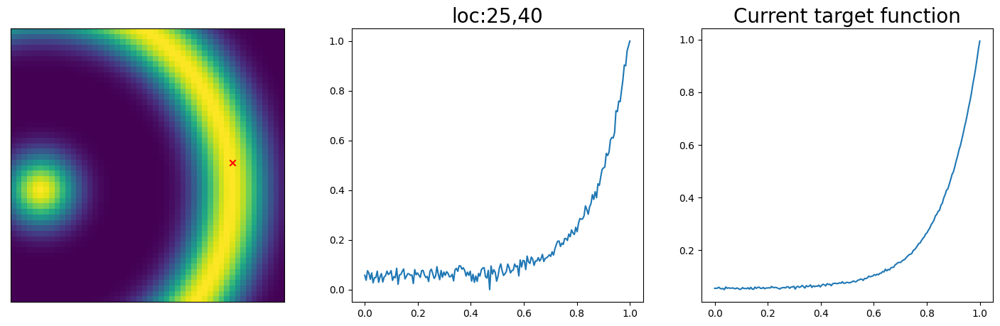

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  67


Sample #100


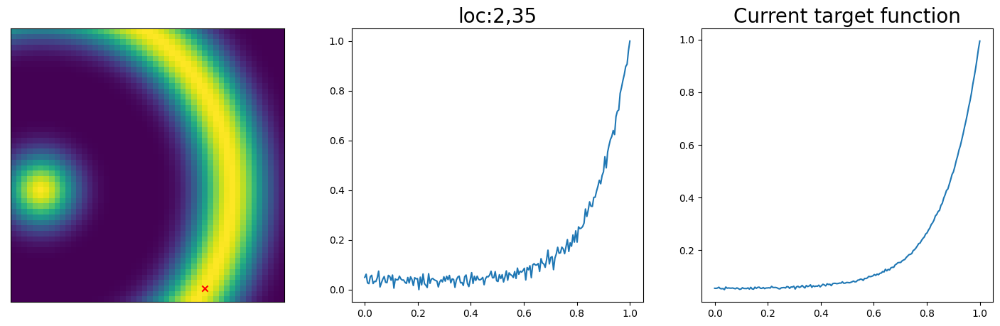

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  68


Sample #101


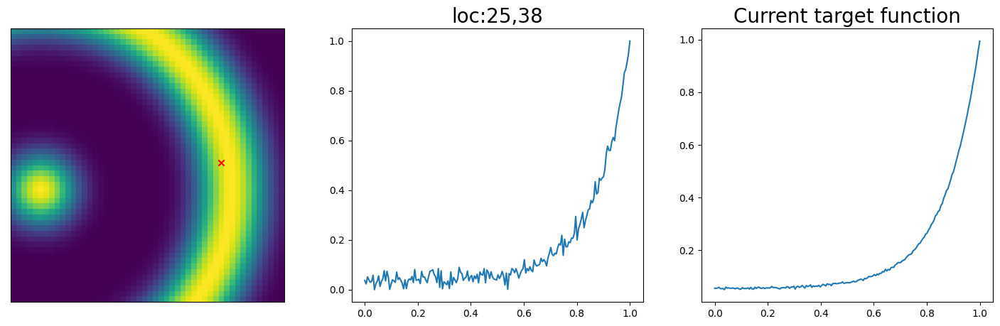

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  69


Sample #102


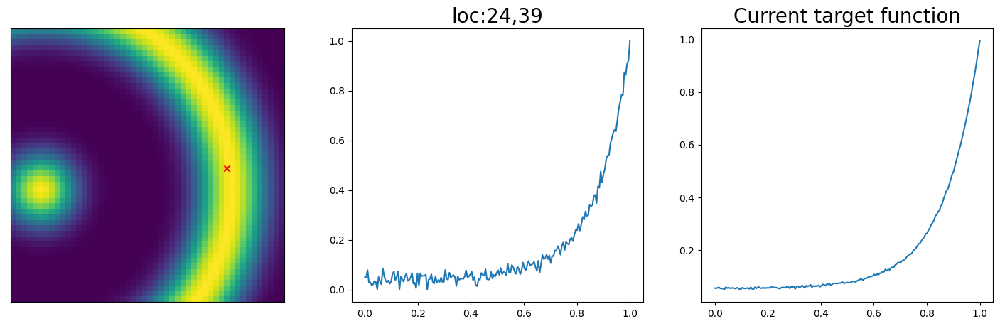

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  70


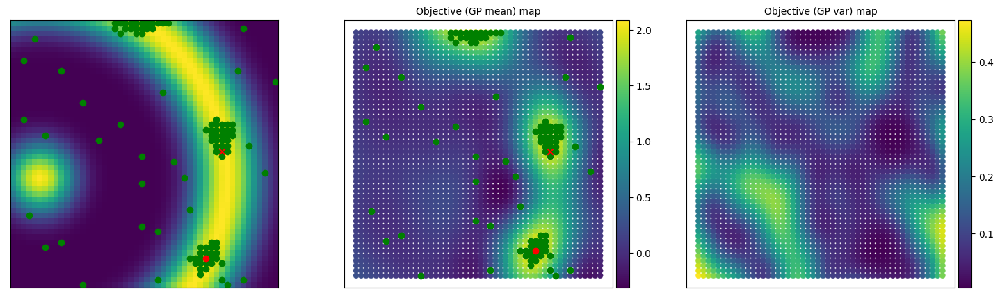



Sample #103


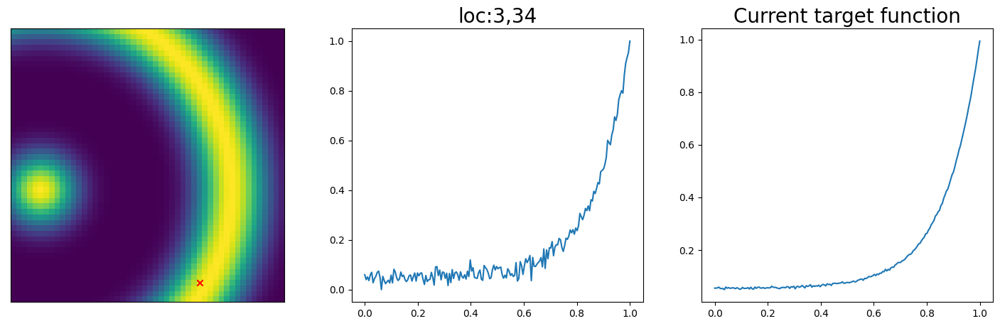

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  71


Sample #104


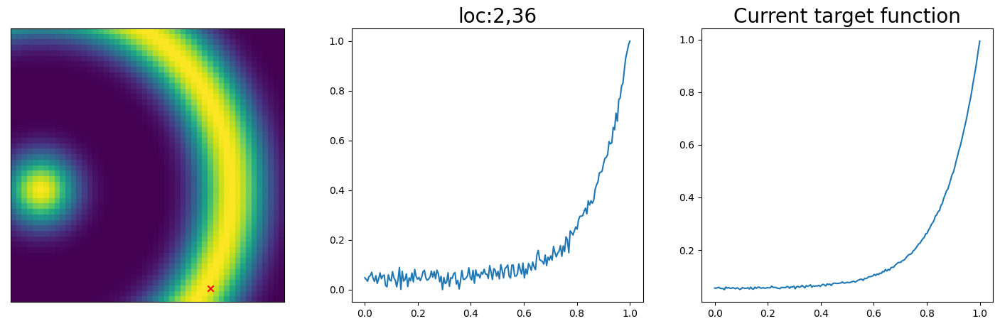

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  72


Sample #105


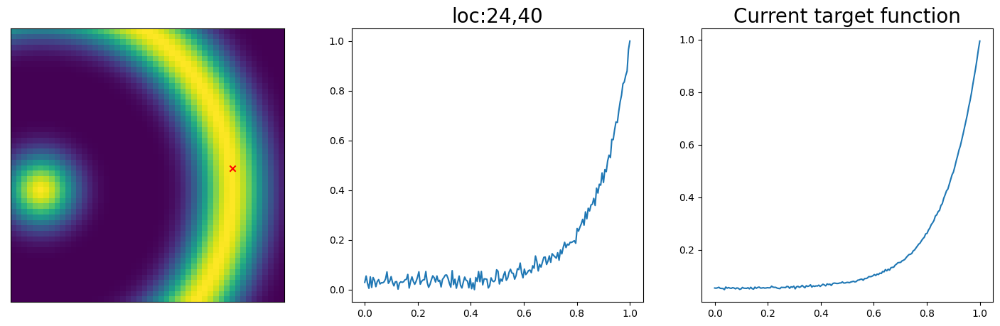

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  73


Sample #106


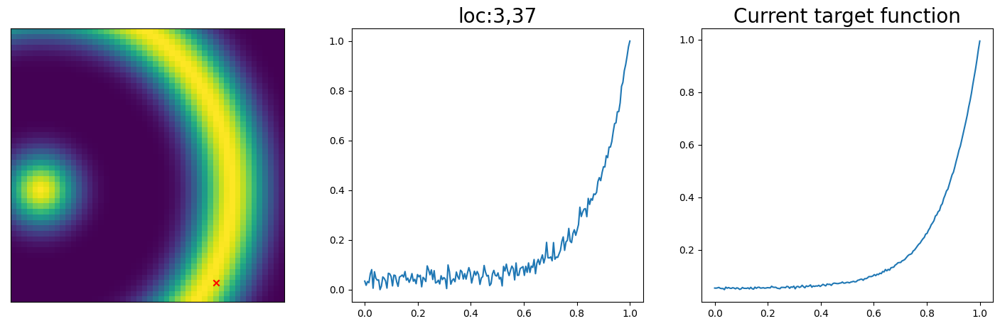

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  74


Sample #107


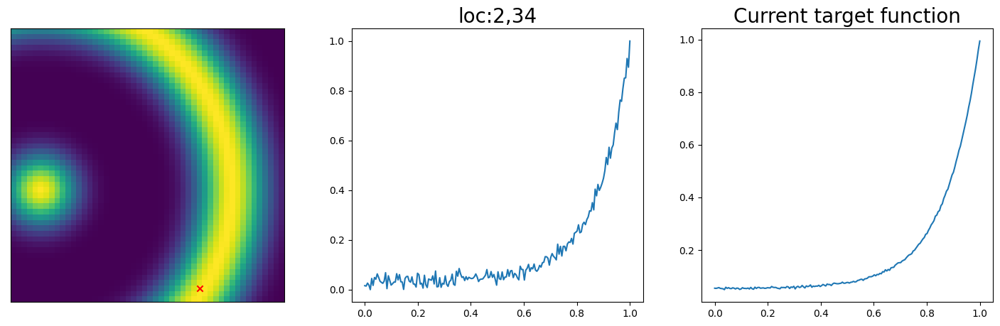

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  75


Sample #108


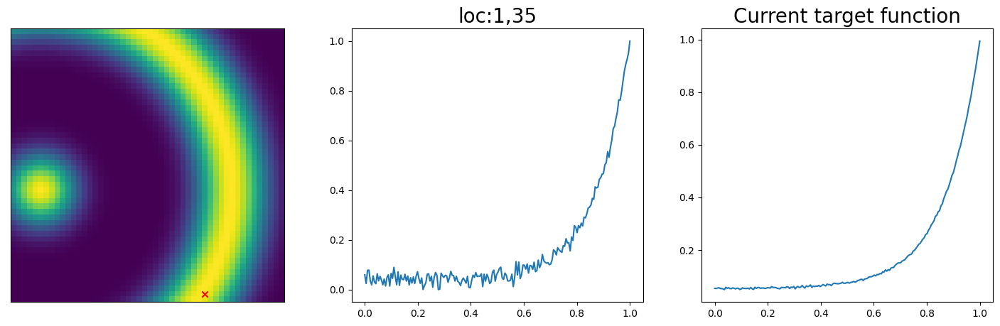

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  76


Sample #109


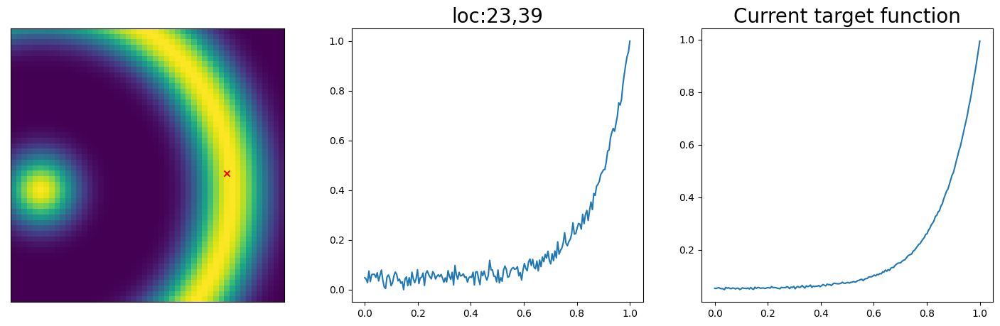

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  77


Sample #110


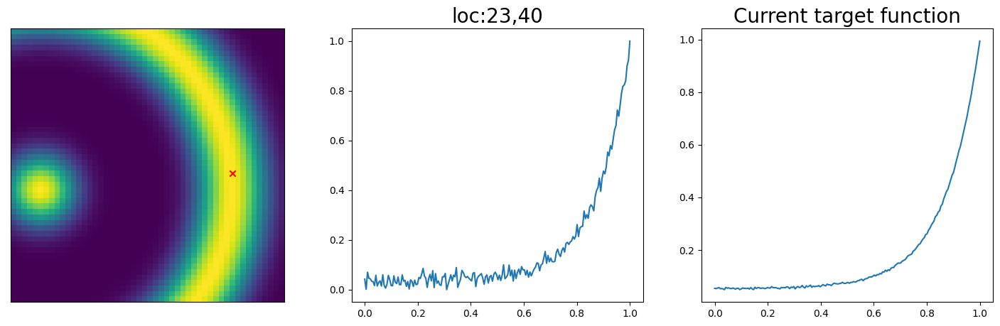

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  78


Sample #111


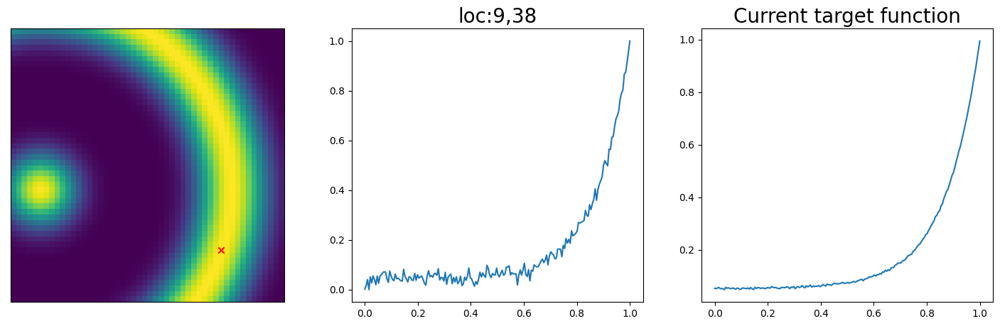

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  79


Sample #112


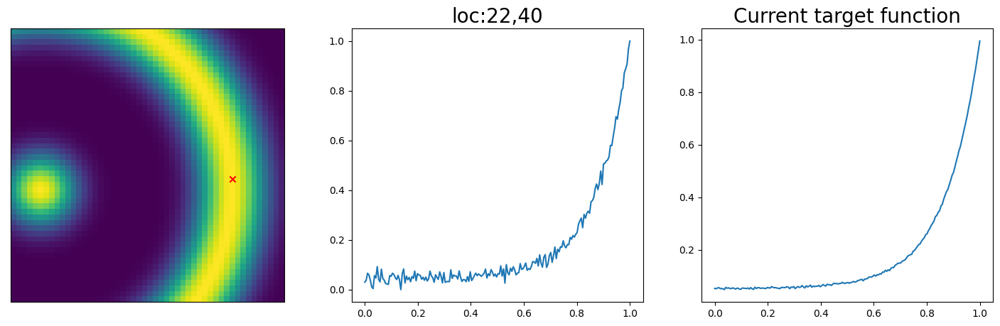

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  80


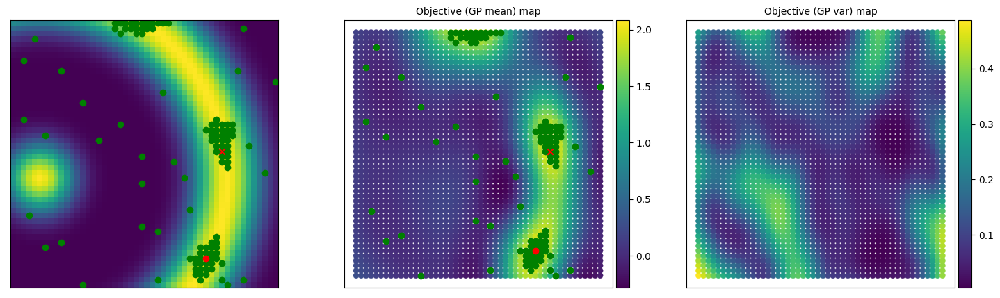



Sample #113


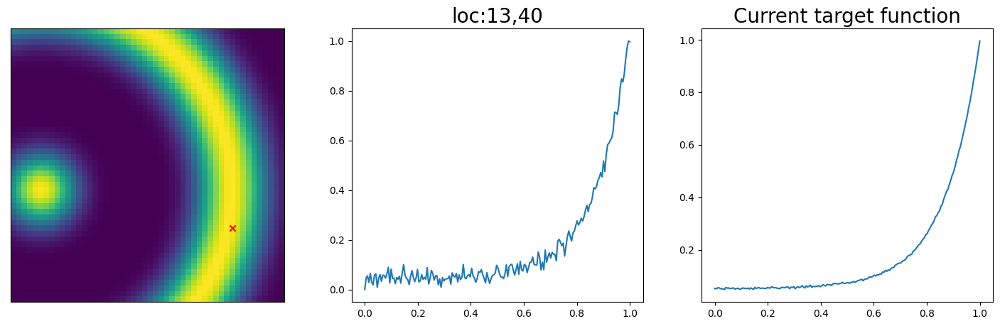

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  81


Sample #114


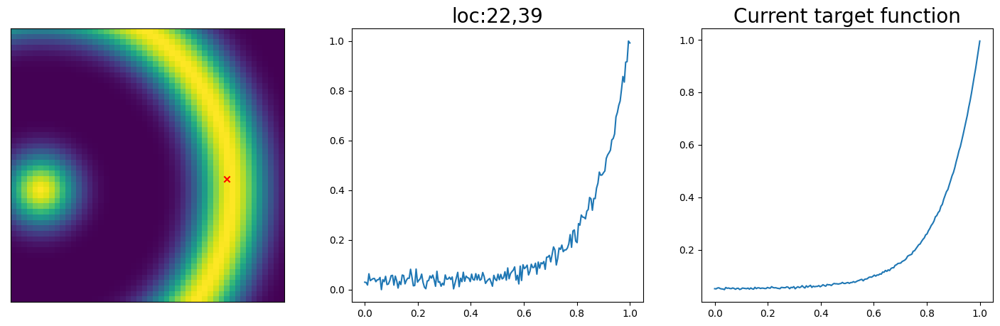

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  82


Sample #115


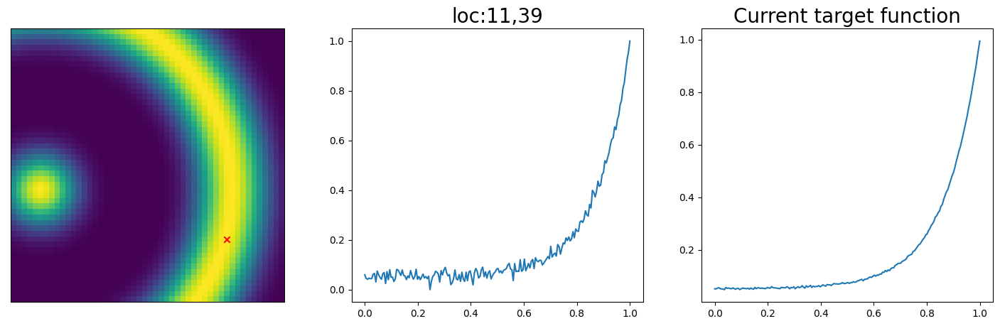

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  83


Sample #116


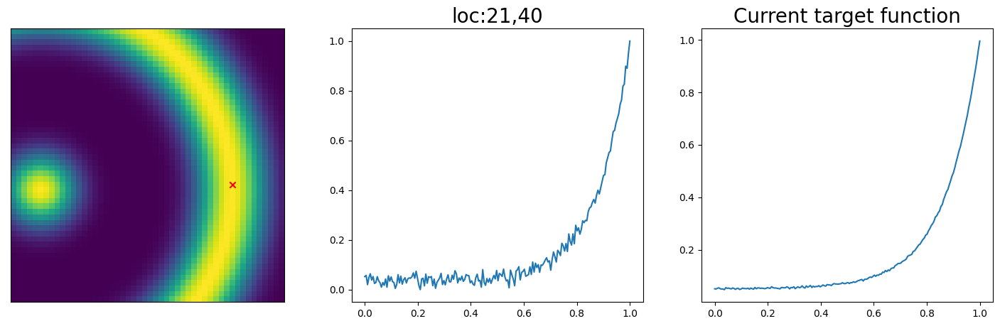

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  84


Sample #117


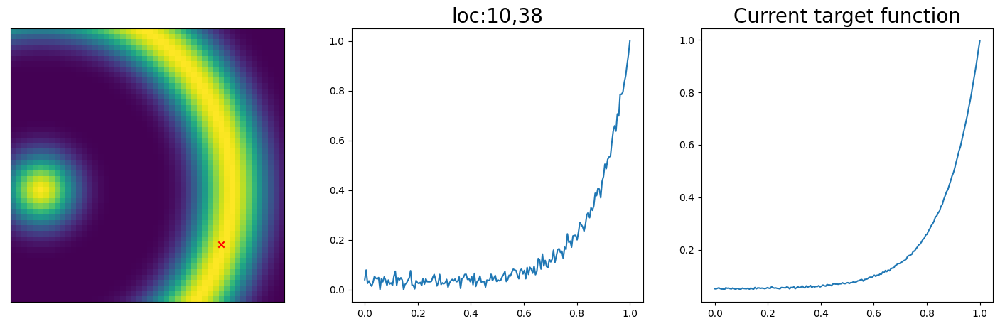

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  85


Sample #118


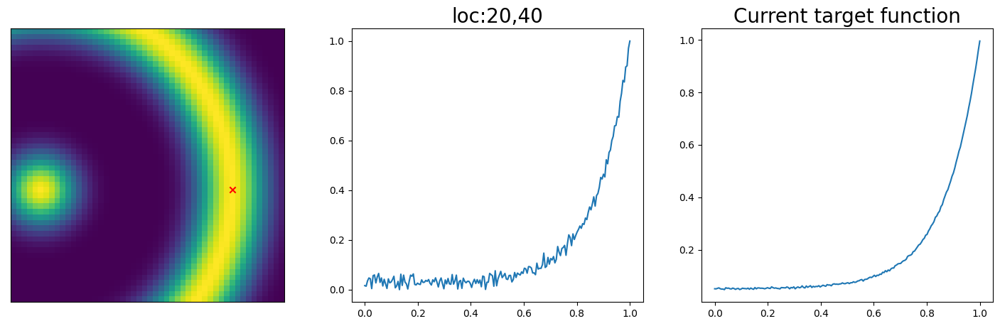

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  86


Sample #119


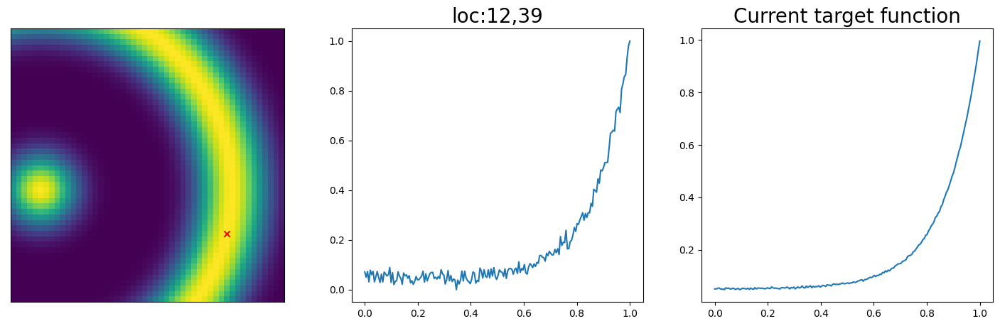

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  87


Sample #120


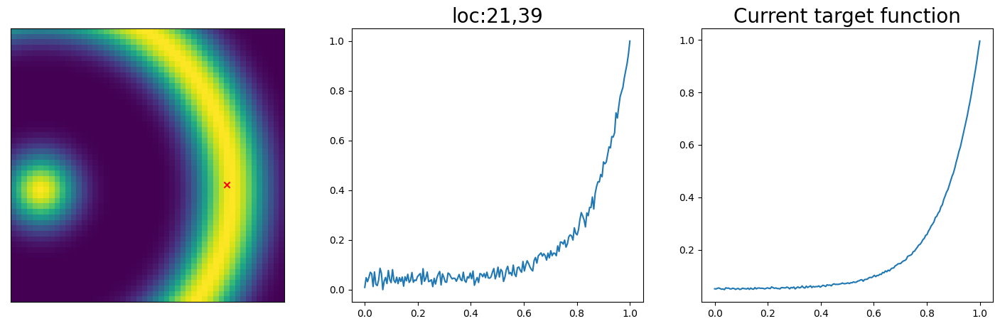

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  88


Sample #121


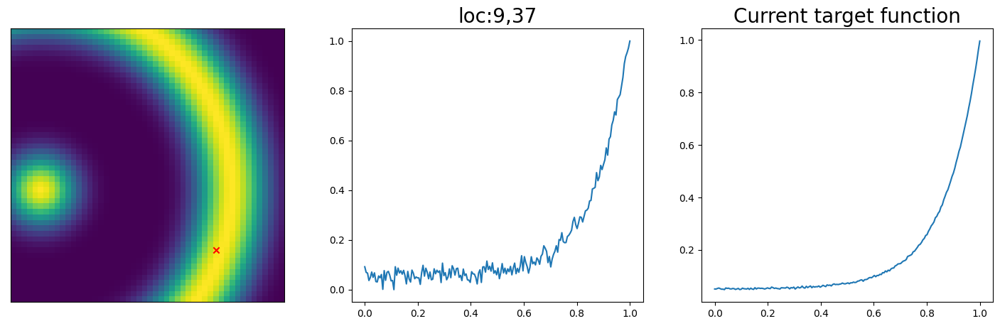

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  89


Sample #122


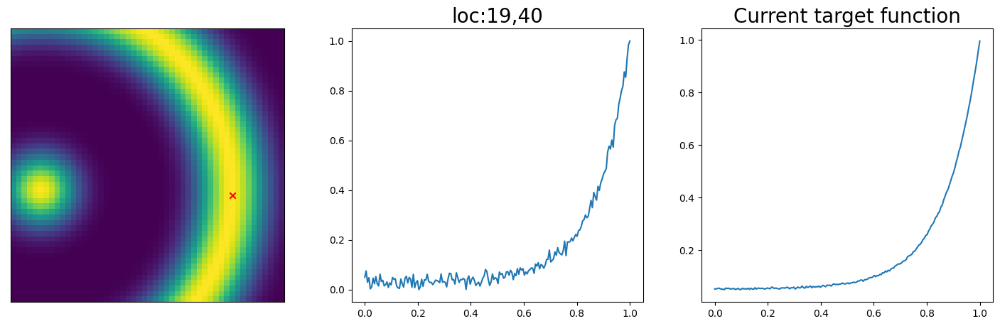

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  90


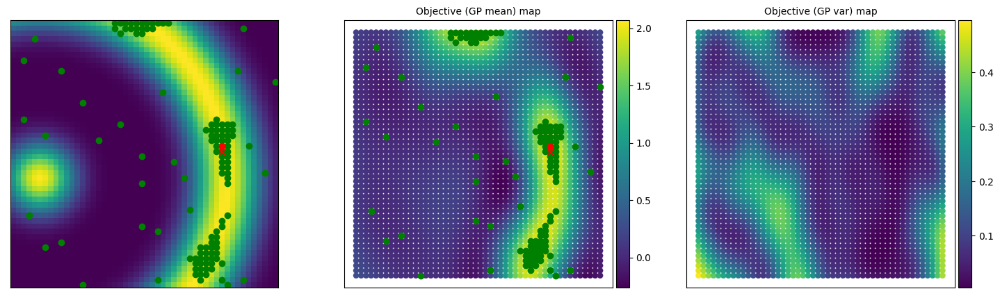



Sample #123


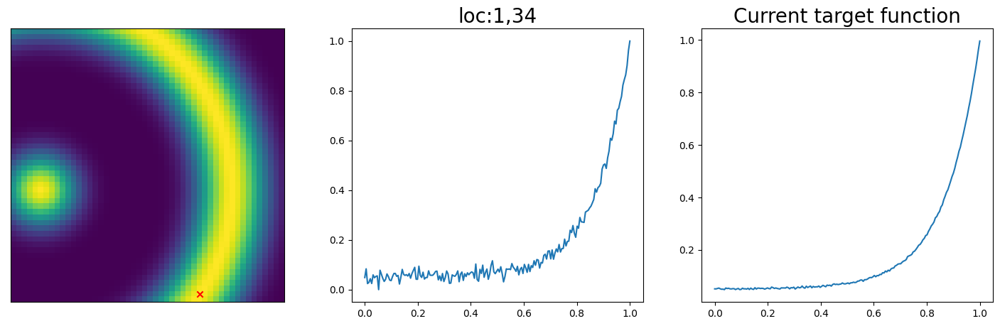

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  91


Sample #124


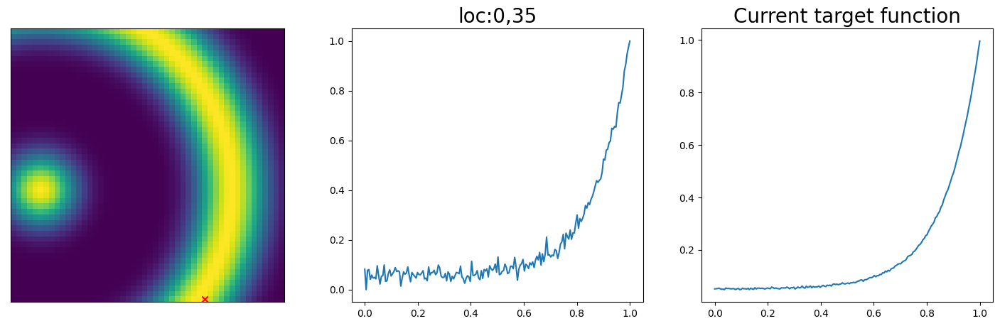

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  92


Sample #125


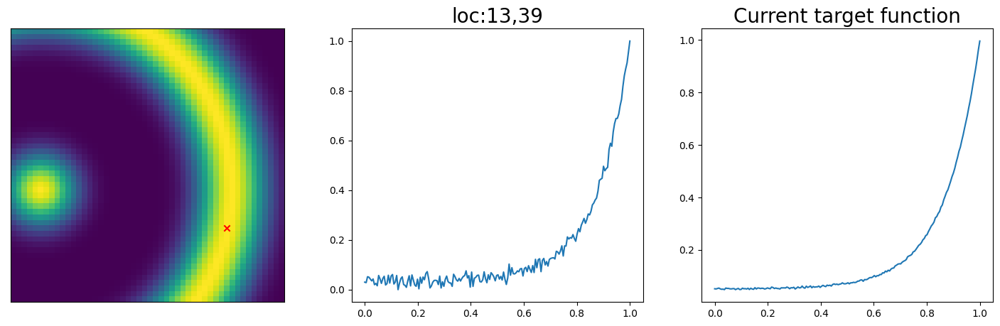

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  93


Sample #126


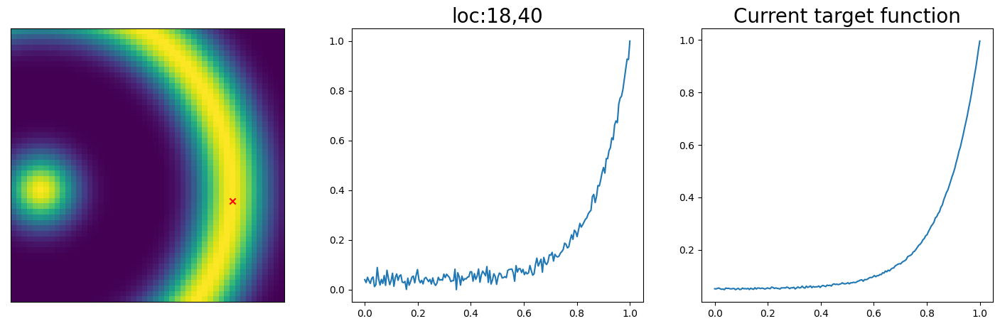

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  94


Sample #127


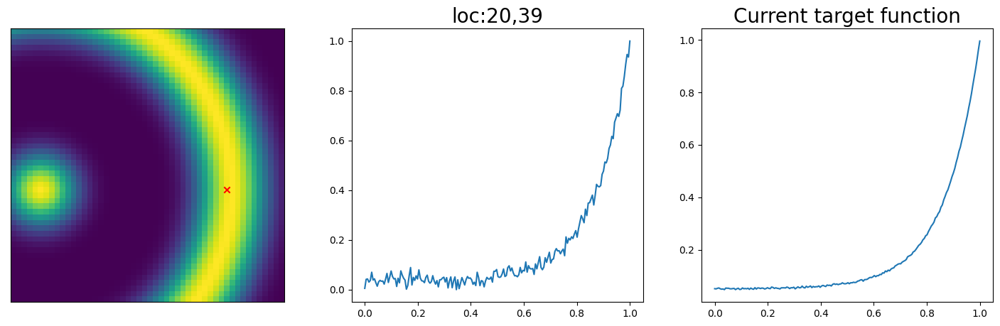

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  95


Sample #128


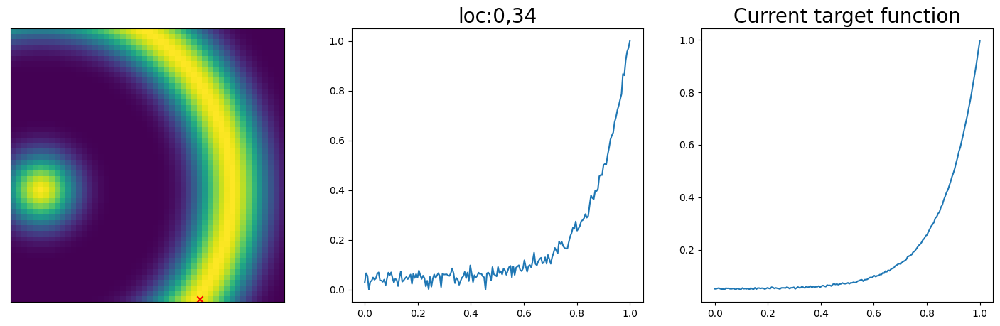

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  96


Sample #129


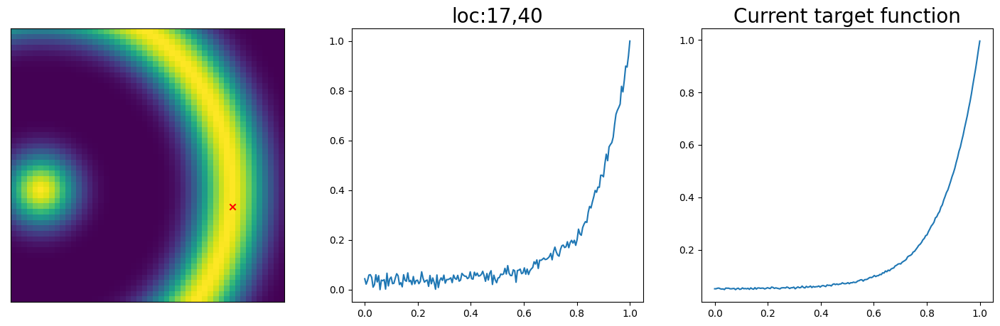

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  97


Sample #130


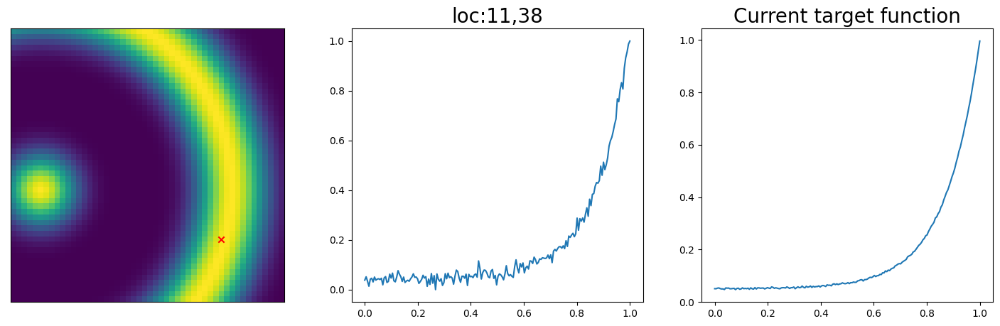

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  98


Sample #131


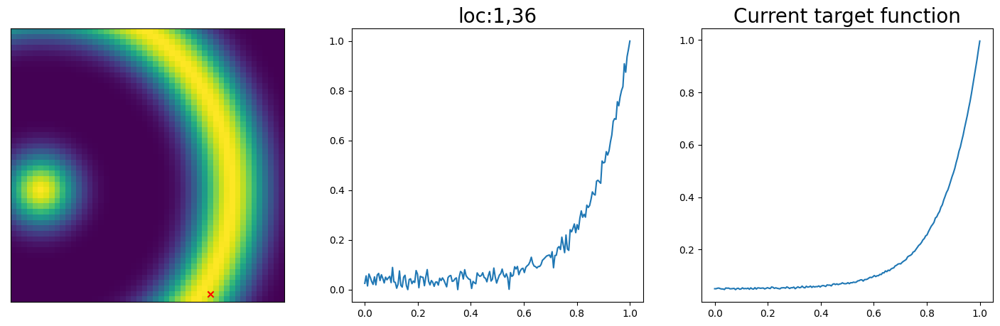

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  99


Sample #132


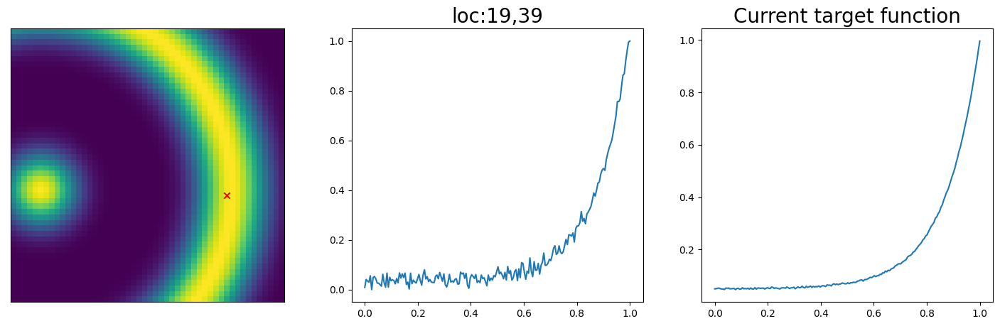

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N
step:  100


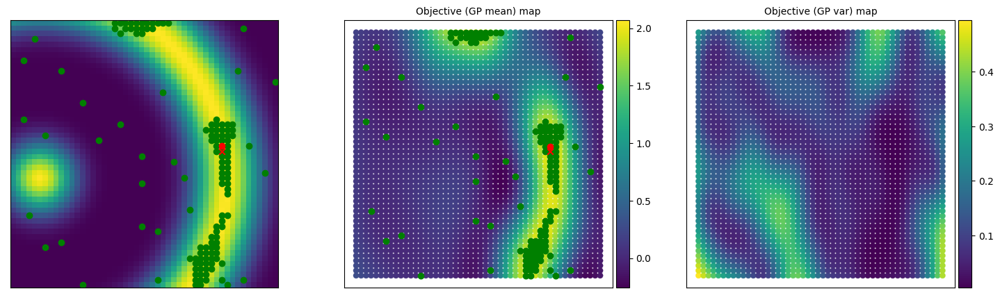



Sample #133


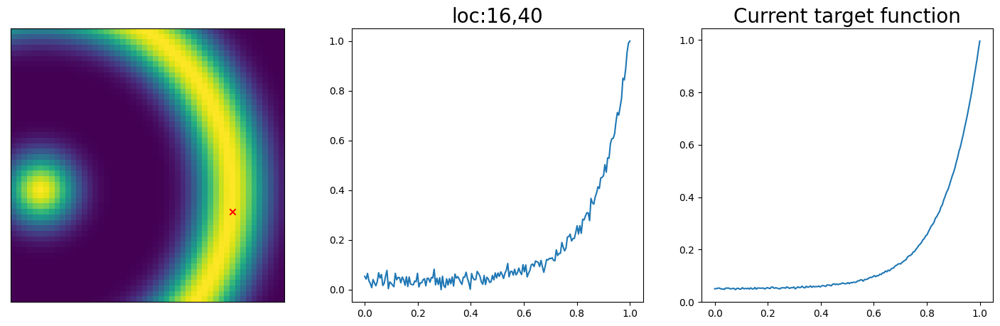

Rating: 0-Bad, 1-Good, 2-Very good
enter rating: 2
Do you want to update preference to new spectral over prioir mean target 
(Y/N): N


#####----Max. sampling reached, model stopped----#####


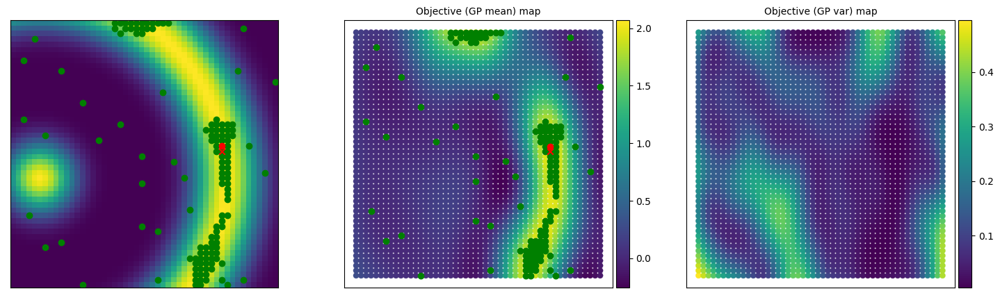

C:\Users\arpan\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\lib\npyio.py:501: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.asanyarray(arr)
C:\Users\arpan\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\lib\npyio.py:501: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [11]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

for i in range(1, N + 1):
  print("step: ", i)
  # Calculate posterior for analysis for intermidiate iterations
  y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
  if ((i == 1) or ((i % 10) == 0)):
    # Plotting functions to check the current state exploration and Pareto fronts
    # X_eval, X_GP = play_varTBO.plot_iteration_results(train_X, train_Y, test_X, y_pred_means,
    #                                            y_pred_vars, new_spec_x, new_spec_y, img, i)
    X_eval, X_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
    plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

  acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
  val = acq_val
  ind = np.random.choice(acq_cand) # When multiple points have same acq values
  idx = np.hstack((idx, ind))

  ## Find next point which maximizes the learning through exploration-exploitation
  if (i == 1):
    val_ini = val
      # Check for convergence
  if ((val) < 0):  # Stop for negligible expected improvement
    print("Model converged due to sufficient learning over search space ")
    break
  else:
    nextX = torch.empty((1, 2))
    nextX_norm = torch.empty(1, 2)
    nextX[0,:] = test_X[ind, :]
    nextX_norm [0, :] = test_X_norm[ind, :]

    ##******************experiment start**********************##
    new_spec_x, new_spec_y = spec_simulator(img, spec_length, int(nextX[0,0]), int(nextX[0,1]))
    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
    ##******************experiment end**********************##

    # Evaluate true function for new data, augment data
    train_X, train_X_norm, train_Y, var_params, m =\
    play_varTBO.augment_newdata_KL(nextX, nextX_norm, train_X, train_X_norm, train_Y,
                                     new_spec_x, new_spec_y, img, var_params, m)

    # Gp model fit
    # Updating GP with augmented training data
    gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
  print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)
# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_X, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data]

#Save few data
np.save("optim_results", optim_results)

# Display results

In [12]:
print(X_opt, X_opt_GP, var_params, explored_data, final_GP_estim)

tensor([[25., 39.]]) tensor([[26., 39.]]) [206.0, tensor([[2.],
        [0.],
        [1.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [1.],
        [2.],
        [0.],
        [0.],
        [2.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [1.],
        [0.],
        [2.],
        [0.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [1.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.],
        [2.]

#################################################################
Display best spectrals


<Figure size 640x480 with 0 Axes>

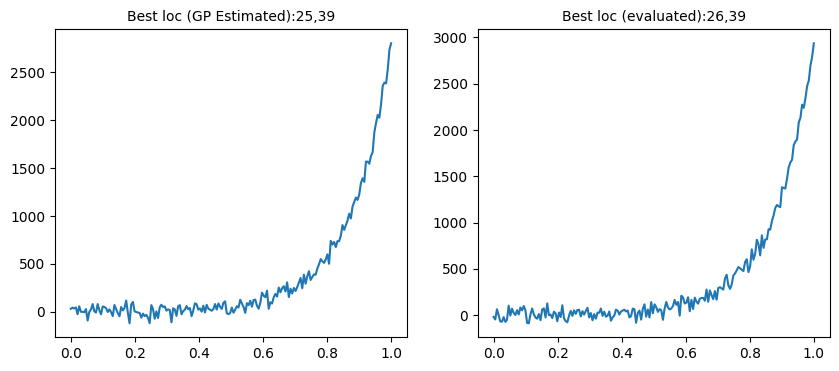

#################################################################
End of Analysis


In [13]:
print("#################################################################")
print("Display best spectrals")
plt.figure()

fig,ax=plt.subplots(ncols=2,figsize=(10,4))

# #Optimal from estimated GP
idx1 = int(X_opt[0, 0])
idx2 = int(X_opt[0, 1])

new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[0].plot(new_spec_x, new_spec_y)
ax[0].set_title('Best loc (GP Estimated):' +str(idx1) +"," + str(idx2), fontsize = 10)

#Optimal from evaluated samples
idx1 = int(X_opt_GP[0, 0])
idx2 = int(X_opt_GP[0, 1])

new_spec_x, new_spec_y = spec_simulator(img, spec_length, idx1, idx2)

ax[1].plot(new_spec_x, new_spec_y)
ax[1].set_title('Best loc (evaluated):' +str(idx1) +"," + str(idx2), fontsize = 10)
plt.show()
print("#################################################################")
print("End of Analysis")